<a href="https://colab.research.google.com/github/asyali-mh/Employee-Network-Analysis/blob/main/Employee_Network_Analysis_(DataCamp_Competition_Entry).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Background
We are working in the analytics department of a multinational company, and the head of HR wants our help mapping out the company's employee network using message data. They plan to use the network map to understand interdepartmental dynamics better and explore how the company shares information. The ultimate goal of this project is to think of ways to improve collaboration throughout the company.

### 299 Seconds (Less than 5 Min.s 😊) Executive Summary:
```
Number of Departments = 6, Number of Employees = 664, Message Count = 3509
Intra-departmental (i.e. within depts.) message count = 920 (26.22%)
Inter-departmental (i.e. among depts.) message count = 2589 (73.78%)
```
The most active departments, in terms of sent and received message counts, are **Sales**, **Operations**, and **Admin**. Marketing department has the lowest sent and received message counts. Receiving performance of Engineering and IT departments are relatively better compared to their sending performance.

#### Intra-departmental communication
- Most messages (538) are sent within **Sales** department, then comes **Operations** and **Admin** with 198 and 172 messages respectively.
- **Marketing** did not send any messages within the department. This could be normal though, as marketing people would **not** try to market anything to each other 😊. Following low scorer departments are **Engineering** and **IT**, both with 6 within-department messages.

#### Inter-departmental communication
- There are 363 messages from **Operations** to **Sales**, 340 messages from **Sales** to **Operations**. Total (both sent and received) message count between these two departments is 703. Most messages (364) are sent from **Sales** to **Admin**. The message count in the reverse direction (i.e. from **Admin** to **Sales**) is 297. Total (both sent and received) message count between these two departments is 661.
- Lowest communication activity took place between **Marketing (M)** and **Engineering (E)** (2 messages from M to E, and 0 from E to M), and between **Marketing (M)** and **IT** (0 messages from M to IT, and 3 from IT to M).

#### Ratings based connection counts
- Top 3 sender employees with most outgoing connections:
```
Emp.id.#	Dept.		Outgoing connection count
598		Operations	77
144		Sales		75
128		Sales		71
```
- Top 3 receiver employees with most incoming connections:
```
Emp.id.# 	Dept.		Incoming connection count
194		Admin		13
 32		Sales		11
249		Admin		9
```
Using graph theoretical network analysis, we selected the following relatively more important 11 nodes (i.e. employees) by combining the analytic power of several "node importance metrics" with the perspective of "connectivity analysis."
```
Emp.id.#	Dept.
128		Sales
509		Admin
260		Operations
389		Sales
605		Admin
586		Operations
144		Sales
337		Sales
598		Operations
317		Operations
734		Sales
```
We note that these important people are mostly from Sales (count=5), Operations (count=4), and Admin (count=2) departments, which agrees with above observations about intra- and inter-departmental communication.

Therefore, our humble recommendation to HR is that they should concentrate on Engineering, IT, and Marketing departments as they have relatively low messaging activity (both internally and with other departments) and look for ways to improve or boost communication of these 3 departments, both within themselves and with other departments.


## 0. Import necessary libraries and load data

In [ ]:
%%capture
!pip install matplotlib-venn
from matplotlib_venn import venn2
import networkx as nx # for network analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df_messages = pd.read_csv('data/messages.csv', parse_dates= ['timestamp'])
df_messages

,sender,receiver,timestamp,message_length
0,79,48,2021-06-02 05:41:34,88
1,79,63,2021-06-02 05:42:15,72
2,79,58,2021-06-02 05:44:24,86
3,79,70,2021-06-02 05:49:07,26
4,79,109,2021-06-02 19:51:47,73
...,...,...,...,...
3507,469,1629,2021-11-24 05:04:57,75
3508,1487,1543,2021-11-26 00:39:43,25
3509,144,1713,2021-11-28 18:30:47,51
3510,1879,1520,2021-11-29 07:27:52,58


In [ ]:
df_employees = pd.read_csv('data/employees.csv')
df_employees

,id,department,location,age
0,3,Operations,US,33
1,6,Sales,UK,50
2,8,IT,Brasil,54
3,9,Admin,UK,32
4,12,Operations,Brasil,51
...,...,...,...,...
659,1830,Admin,UK,42
660,1839,Admin,France,28
661,1879,Engineering,US,40
662,1881,Sales,Germany,57


## 1. "Get to know" the data

### 1.1 Warmup: Inspect *df_messages* and *df_employees* dataframes
For each dataframe, we can find out the size and type of the data in each column (i.e. variable) using the info() method as follows:

In [ ]:
df_messages.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3512 entries, 0 to 3511
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   sender          3512 non-null   int64         
 1   receiver        3512 non-null   int64         
 2   timestamp       3512 non-null   datetime64[ns]
 3   message_length  3512 non-null   int64         
dtypes: datetime64[ns](1), int64(3)
memory usage: 109.9 KB


In [ ]:
df_employees.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 664 entries, 0 to 663
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   id          664 non-null    int64 
 1   department  664 non-null    object
 2   location    664 non-null    object
 3   age         664 non-null    int64 
dtypes: int64(2), object(2)
memory usage: 20.9+ KB


We observe that there are no missing values in either of the dataframes. Let's make sure:

In [ ]:
df_messages.isna().sum()

sender            0
receiver          0
timestamp         0
message_length    0
dtype: int64

In [ ]:
df_employees.isna().sum()

id            0
department    0
location      0
age           0
dtype: int64

We had better check each table for duplicated rows as well. We don't expect any duplicates in the **df_employee** table, as its "id" column is the key (i.e. unique identifier) for employees. However, we suspect that 😊 there could be some duplicates in the **df_messages** table. Let us see:

In [ ]:
df_employees.duplicated().sum(),df_messages.duplicated().sum()

(0, 3)

Aha! We cought 3 duplicated rows in the **df_messages** table. Let's see which those (duplicated) rows and get rid of them:

In [ ]:
print('Duplicated rows in df_messages are:')
display(df_messages[df_messages.duplicated(keep=False)].sort_values('sender'))
df_messages = df_messages.drop_duplicates()
print(f'Number of duplicated rows in df_messages after dropping duplicates is {df_messages.duplicated().sum()} 😊')

Duplicated rows in df_messages are:


,sender,receiver,timestamp,message_length
3365,1657,1675,2021-11-02 07:42:25,52
3478,1657,1675,2021-11-02 07:42:25,52
3333,1807,32,2021-10-13 22:25:17,50
3446,1807,32,2021-10-13 22:25:17,50
3377,1881,1676,2021-11-17 06:45:28,27
3490,1881,1676,2021-11-17 06:45:28,27


Number of duplicated rows in df_messages after dropping duplicates is 0 😊


Finally, as it will provide us with some indexing advantages in our upcoming steps of analysis, we'll make a copy **df_employees** table (and name it as **df_employees2**), where we set the id column as the row index:

In [ ]:
df_employees2 = df_employees.set_index('id')
df_employees2.head()

,department,location,age
id,,,
3,Operations,US,33
6,Sales,UK,50
8,IT,Brasil,54
9,Admin,UK,32
12,Operations,Brasil,51


### 1.2. Merge *df_messages* and *df_employees* dataframes
Let us merge **df_messages** and **df_employees** to combine information in both dataframes based on the **id** key and retain only the variables (i.e. sender and receiver department info) to be used in the subsequent analysis. We will call the resultant (merged) dataframe **df_merged**:

In [ ]:
df_merged = df_messages.merge(df_employees,left_on='sender',right_on='id').drop(columns=['message_length','id','location','age'])
df_merged = df_merged.merge(df_employees,left_on='receiver',right_on='id',suffixes=('_sender','_receiver')).drop(columns=['id','location','age'])
df_merged

,sender,receiver,timestamp,department_sender,department_receiver
0,79,48,2021-06-02 05:41:34,Sales,IT
1,144,48,2021-06-05 11:19:34,Sales,IT
2,144,48,2021-06-05 11:35:09,Sales,IT
3,144,48,2021-06-05 11:39:57,Sales,IT
4,144,48,2021-06-07 08:09:32,Sales,IT
...,...,...,...,...,...
3504,1881,1079,2021-11-17 07:11:12,Sales,Engineering
3505,1881,1079,2021-11-17 07:21:27,Sales,Engineering
3506,1881,1079,2021-11-17 07:25:51,Sales,Engineering
3507,1881,1079,2021-11-17 07:27:59,Sales,Engineering


### 1.3 Check timespan of messages, visualize daily and monthly message counts
Out of our "data-scientific" curiosity 😊, we feel obliged to check the timespan of the messages:

In [ ]:
min_date,max_date = df_messages.timestamp.min(),df_messages.timestamp.max()
time_span = max_date-min_date
print(f"We have {time_span.days} days of messaging data (from {min_date.strftime('%b-%d-%y')} to {max_date.strftime('%b-%d-%y')}).")

We have 180 days of messaging data (from Jun-02-21 to Nov-29-21).


Let us now make plots of daily and monthly message counts:

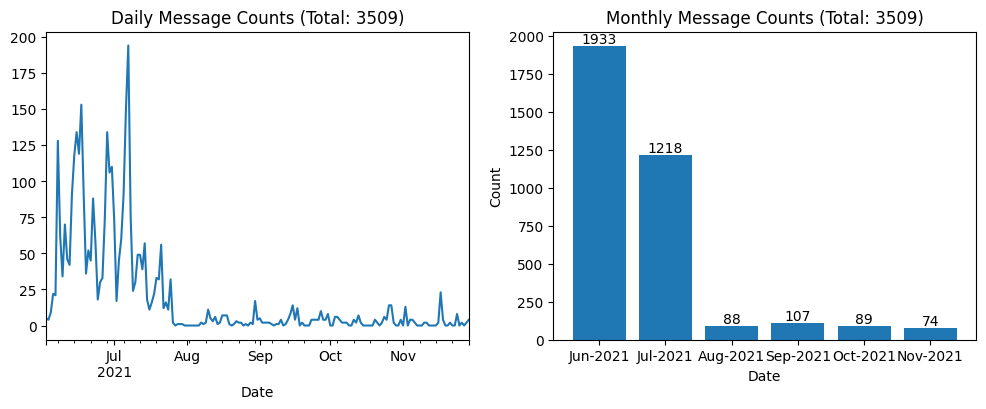

In [ ]:
_, (ax1,ax2) = plt.subplots(1,2,figsize=(12,4))
daily_cnts = df_messages.resample('D',on='timestamp').size(); daily_cnts.plot(ax=ax1)
ax1.set_xlabel('Date'); ax2.set_ylabel('Count'); ax1.set_title(f'Daily Message Counts (Total: {daily_cnts.sum()})')
mnth_cnts = df_messages.resample('M',on='timestamp').size()
bars = ax2.bar(mnth_cnts.index.strftime('%b-%Y'),mnth_cnts.values); ax2.bar_label(bars)
ax2.set_xlabel('Date'); ax2.set_ylabel('Count'); ax2.set_title(f'Monthly Message Counts (Total: {mnth_cnts.sum()})'); plt.show()

We can also look into weekly and monthly "sent and received message counts" by department, to see if the composition (i.e. distribution) of counts by department changes over time. To that end, let's define a few helper functions:

In [ ]:
def get_cnts(df_in,col_name,sample_time):
  return df_in.groupby(col_name).resample(sample_time,on='timestamp').size().unstack(col_name).fillna(0)

def convert_to_percentage(df_in):
  row_sums = np.tile(df_in.sum(axis=1).values.reshape(-1,1),6)
  perc_vals = 100*df_in.reset_index().iloc[:,1:].values/row_sums
  df_perc = pd.DataFrame(perc_vals,index=df_in.index,columns=df_in.columns)
  return df_perc

def bar_plot_maker(df_in,ax_in,y_label_str,title_str,frmt_str):
  df_in.plot.bar(stacked=True,ax=ax_in)
  ax_in.set_xticklabels(df_in.index.strftime(frmt_str))
  ax_in.set_xlabel('Date'); ax_in.set_ylabel(y_label_str); ax_in.set_title(title_str)

def twin_plot_maker(df_cnt,ax_in1,ax_in2,title_str,frmt_str):
  df_perc = convert_to_percentage(df_cnt)
  bar_plot_maker(df_cnt,ax_in1,'Count',title_str,'')
  bar_plot_maker(df_perc,ax_in2,'Percentage',title_str+' (Percentage)',frmt_str)
  ax_in2.get_legend().remove()

As we see below, first few 8 weeks (or 2 months) of high values in both "sent" and "received" message counts are blocking the view for the rest of the data. Therefore, along with plain counts, we have also computed and plotted "percentage count plots" so that we can see the departmental composition of message counts anywhere along the time axis more clearly.
#### 1.3.1 Weekly sent and received message count analysis

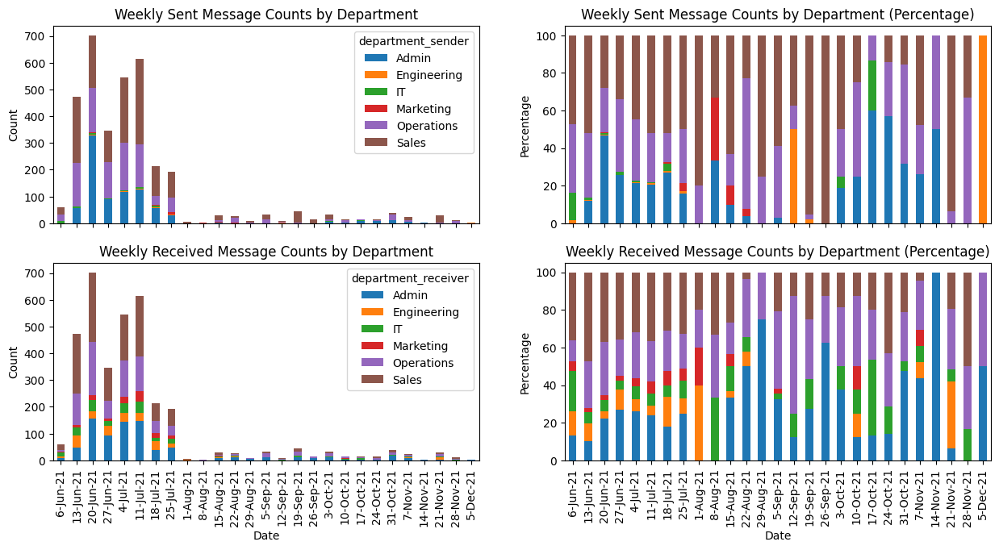

In [ ]:
_,((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2,figsize=(15,7),sharex=True)
cnts_by_dept = get_cnts(df_merged,'department_sender','W')
twin_plot_maker(cnts_by_dept,ax1,ax2,'Weekly Sent Message Counts by Department','%-d-%b-%y')
cnts_by_dept = get_cnts(df_merged,'department_receiver','W')
twin_plot_maker(cnts_by_dept,ax3,ax4,'Weekly Received Message Counts by Department','%-d-%b-%y')

#### 1.3.2 Monthly sent and received message count analysis

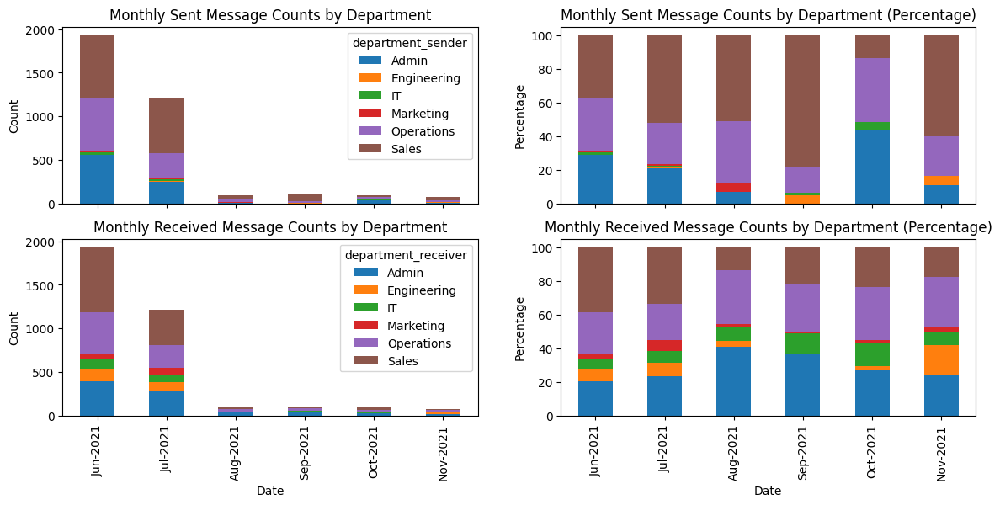

In [ ]:
_,((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2,figsize=(14,6),sharex=True)
cnts_by_dept = get_cnts(df_merged,'department_sender','M')
twin_plot_maker(cnts_by_dept,ax1,ax2,'Monthly Sent Message Counts by Department','%b-%Y')
# cnts_by_dept = get_cnts(df_merged,'department_receiver','M')
cnts_by_dept = df_merged.groupby('department_receiver').resample('M',on='timestamp').size().T
twin_plot_maker(cnts_by_dept,ax3,ax4,'Monthly Received Message Counts by Department','%b-%Y')

We observe that the most active departments, in terms of sent and received message counts, are **Sales**, **Operations**, and **Admin**, and this count composition does not change "too much" 😊 over time. That is, once active is always active 😊 and vice versa, according to our message data. Nevertheless, as it is evident from percentage count plots, "receiving" performance of **Engineering** and **IT** departments are slightly better than their "sending" performance.

Messaging performance or activity of **Marketing** department is consistently low by plain count and percentage measures. Maybe they are too busy "marketing" which may mostly involve communication outside the company. Information regarding issue is not included in the "messages data" shared with us. Therefore, without seeing the big picture (which may require access to more data or info), we had better be very cautious about making any conclusive remarks.

Another interesting observation we can make is that, in June and July of 2021, message traffic in the company was pretty high, then in the **Fall** season, along with falling tree leaves 😊, message traffic in the company fell drastically. Maybe this is an ice-cream 🍦🍨 company, who knows?.. 😊
### 1.4 Find sets of message "sender" and "receiver" employees
We can identify sets of message sender and receiver employees as follows:

In [ ]:
all_employees, senders, receivers = set(df_employees.id), set(df_messages.sender), set(df_messages.receiver)
N_all, N_sender, N_receiver = len(all_employees), len(senders), len(receivers)
print(f'Out of {N_all} employees, there are {N_sender} senders and {N_receiver} receivers')
print(f'{N_sender+N_receiver-N_all} employees are both senders and receivers')

Out of 664 employees, there are 85 senders and 617 receivers
38 employees are both senders and receivers


It seems that there are way more receiver employees than senders (617 vs 85). This is normal, as, for instance, administrators can send messages targeting many receiver employees. We also note there are 38 employees who both sent and received messages.

If all of the employees listed in **df_employees** are involved in at least one of sending and/or receving activity, then the union of **senders** and **receivers** must give us the set of **all_employees**. Let us check this point using set operations:

In [ ]:
print(f'Is the "union of senders and receivers" set is equal to the set of "all employees"? {all_employees==senders.union(receivers)}')
# all_employees==(senders|receivers) also works 😊

Is the "union of senders and receivers" set is equal to the set of "all employees"? True


As you will see and appreciate 😊 with the following graph, the best way to visualize sets is the Venn diagram:

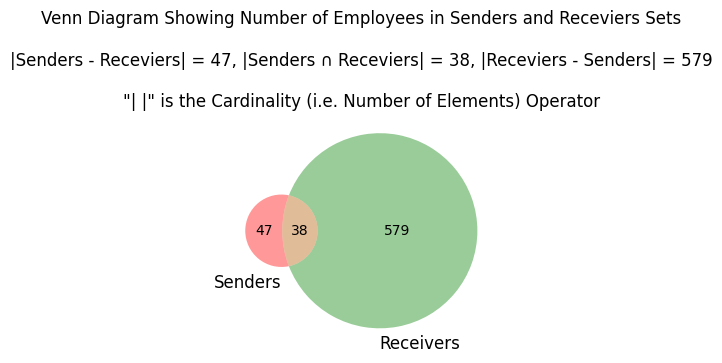

In [ ]:
plt.figure(figsize=(6,3))
vd = venn2([senders,receivers],set_labels=('Senders','Receivers'))
plt.title('Venn Diagram Showing Number of Employees in Senders and Receviers Sets\n\n|Senders - Receviers| = 47, |Senders ∩ Receviers| = 38, |Receviers - Senders| = 579\n\n"| |" is the Cardinality (i.e. Number of Elements) Operator'); plt.show()

Using the following code snippet, we again can confirm that:
```
Number of "Senders only" + Number of "both Senders and Receivers" +
                           Number of "Receivers only" = Number of "All Employees"
```


In [ ]:
n_S_only, n_R_only, n_SR = [int(vd.subset_labels[i]._text) for i in range(3)]
print(f'Sum of the number of elements in the 3 regions of the Venn diagram is:\nNumber of "Senders only" ({n_S_only}) +\nNumber of "both Senders and Receivers" ({n_SR}) +\nNumber of "Receivers only" ({n_R_only})\n{"":32} = {n_S_only} + {n_SR} + {n_R_only} = {n_S_only+n_R_only+n_SR} (Number of Employees)')

Sum of the number of elements in the 3 regions of the Venn diagram is:
Number of "Senders only" (47) +
Number of "both Senders and Receivers" (38) +
Number of "Receivers only" (579)
                                 = 47 + 38 + 579 = 664 (Number of Employees)


## 2. Which departments are the most/least active?<a id="Sec_2_1"></a>


### 2.1 Rate messaging activity of departments using "value counts" method
Using the **value_counts()** method on the **department_sender** and **department_receiver** columns of the merged dataframe (i.e. **df_merged**), we can quantify and plot:
- message **sending activity** and
- message **receiving activity**

as total message count stratified (or grouped) by department:

Total Sent and Received Message Counts by Department (Sorted by Counts in descending order):


,Sender_Dept,Sent_Count,Receiver_Dept,Received_Count
0,Sales,1549,Sales,1227
1,Operations,1013,Operations,845
2,Admin,856,Admin,797
3,IT,49,Engineering,251
4,Engineering,26,IT,249
5,Marketing,16,Marketing,140


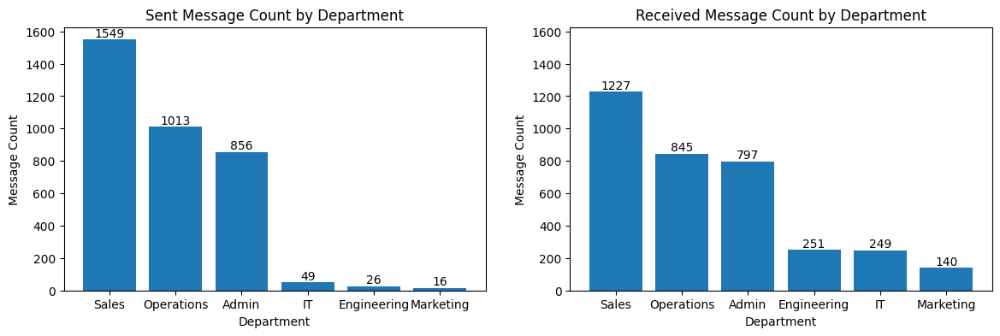

In [ ]:
sender_dept_cnts = df_merged.department_sender.value_counts()
receiver_dept_cnts = df_merged.department_receiver.value_counts()
results = np.hstack(([*zip(sender_dept_cnts.index,sender_dept_cnts.values)],[*zip(receiver_dept_cnts.index,receiver_dept_cnts.values)]))
df_results = pd.DataFrame(results,columns=['Sender_Dept','Sent_Count','Receiver_Dept','Received_Count'])
df_results = df_results.astype(dtype={'Sent_Count':'int','Received_Count':'int'})
print('Total Sent and Received Message Counts by Department (Sorted by Counts in descending order):')
display(df_results)
_, (ax1,ax2) = plt.subplots(1,2,figsize=(14,4))
bars = ax1.bar(sender_dept_cnts.index,sender_dept_cnts); ax1.bar_label(bars)
ax1.set_ylabel('Message Count'); ax1.set_xlabel('Department'); ax1.set_title('Sent Message Count by Department')
bars = ax2.bar(receiver_dept_cnts.index,receiver_dept_cnts); ax2.bar_label(bars)
ax2.set_ylabel('Message Count'); ax2.set_xlabel('Department'); ax2.set_title('Received Message Count by Department')
ax2.set_ylim(ax1.get_ylim()); plt.show()

Graphs are looking good and telling us everything; however, to flex our "pandas" muscles and show off 😊, we can still create a little summary table to report our findings in a concise and precise manner 😊:

In [ ]:
df_summary = [[df_results.iloc[0,1],df_results.iloc[0,0],df_results.iloc[5,1],df_results.iloc[5,0]],
           [df_results.iloc[0,3],df_results.iloc[0,2],df_results.iloc[5,3],df_results.iloc[5,2]]]
print('Summary Table Indicating Most and Least Active Departments via Max/Min Counts:')
pd.DataFrame(df_summary,index=['Sent','Received'],columns=['Max_Count','Max_Dept','Min_Count','Min_Dept'])

Summary Table Indicating Most and Least Active Departments via Max/Min Counts:


,Max_Count,Max_Dept,Min_Count,Min_Dept
Sent,1549,Sales,16,Marketing
Received,1227,Sales,140,Marketing


Since number of employees are different for different departments, we'd better also check counts in terms of "per employee" basis to make a fair comparison. To this end, we'll add two columns to our **df_results** counts table that we generated moments 😊 ago:

In [ ]:
dept_cnts = df_employees2.department.value_counts()
display(dept_cnts.reset_index().rename(columns={'index':'Dept_Name','department':'People_Count'}))
print('Updated results table:')
df_results['Sent_Cnt_Nrmlzd_by_Dpt_Cnt'] = df_results.Sent_Count.values/dept_cnts.reindex(df_results.Sender_Dept).values
df_results['Received_Cnt_Nrmlzd_by_Dpt_Cnt'] = df_results.Received_Count.values/dept_cnts.reindex(df_results.Receiver_Dept).values
df_results

,Dept_Name,People_Count
0,Sales,161
1,Admin,140
2,Operations,134
3,Engineering,100
4,IT,77
5,Marketing,52


Updated results table:


,Sender_Dept,Sent_Count,Receiver_Dept,Received_Count,Sent_Cnt_Nrmlzd_by_Dpt_Cnt,Received_Cnt_Nrmlzd_by_Dpt_Cnt
0,Sales,1549,Sales,1227,9.621118,7.621118
1,Operations,1013,Operations,845,7.559701,6.305970
2,Admin,856,Admin,797,6.114286,5.692857
3,IT,49,Engineering,251,0.636364,2.510000
4,Engineering,26,IT,249,0.260000,3.233766
5,Marketing,16,Marketing,140,0.307692,2.692308


In [ ]:
print(f'Dept.s sorted (descending) by plain "Sent" message counts:             {*df_results.Sender_Dept[df_results.Sent_Count.sort_values(ascending=False).index],}')
print(f'Dept.s sorted (descending) by "Sent" message counts per dept employee: {*df_results.Sender_Dept[df_results.Sent_Cnt_Nrmlzd_by_Dpt_Cnt.sort_values(ascending=False).index],}')

Dept.s sorted (descending) by plain "Sent" message counts:             ('Sales', 'Operations', 'Admin', 'IT', 'Engineering', 'Marketing')
Dept.s sorted (descending) by "Sent" message counts per dept employee: ('Sales', 'Operations', 'Admin', 'IT', 'Marketing', 'Engineering')


In [ ]:
print(f'Dept.s sorted (descending) by plain "Received" message counts:             {*df_results.Receiver_Dept[df_results.Received_Count.sort_values(ascending=False).index],}')
print(f'Dept.s sorted (descending) by "Received" message counts per dept employee: {*df_results.Receiver_Dept[df_results.Received_Cnt_Nrmlzd_by_Dpt_Cnt.sort_values(ascending=False).index],}')

Dept.s sorted (descending) by plain "Received" message counts:             ('Sales', 'Operations', 'Admin', 'Engineering', 'IT', 'Marketing')
Dept.s sorted (descending) by "Received" message counts per dept employee: ('Sales', 'Operations', 'Admin', 'IT', 'Marketing', 'Engineering')



We observe that department ordering according to plain counts and counts normalized by people count in respective departments are very similar. Top-tiers are always 'Sales', 'Operations', and 'Admin' with that order. Naturally 😊, remaining three departments, namely 'Engineering', 'IT', and 'Marketing,' are always bottom-tiers, whose order (within themselves) may change depending on "sender" vs "receiver" role or "plain" vs "per head" counts, which we believe 😊 is of minor importance.

In summary, **most** and **least** active departments are **Sales** and **Marketing** respectively, in terms of **both sending and receiving**. As we've pointed earlier (in Section 1.3), maybe "marketing people" communicating mostly with people from outside the company just to do marketing 😊.
### 2.2 Rate messaging activity of departments using "pivot table" method
We can breakdown the total activity by department and examine how frequently departments communicate **within themselves** and **with each other** using a **pivot table**, as follows:

In [ ]:
df_reduced = df_merged[['department_sender','department_receiver','sender']]
df_reduced.columns = ['Sender_Dept','Receiver_Dept','']
df_pivot = df_reduced.pivot_table(index='Sender_Dept',columns='Receiver_Dept',aggfunc='count',
                       margins=True,margins_name='Total',fill_value=0)
df_pivot.columns = pd.Index(['Admin','Engineering','IT','Marketing','Operations','Sales',
                            'Total'], name='Receiver_Dept')
df_pivot

Receiver_Dept,Admin,Engineering,IT,Marketing,Operations,Sales,Total
Sender_Dept,,,,,,,
Admin,172,33,48,19,287,297,856
Engineering,4,6,3,0,8,5,26
IT,8,6,6,3,10,16,49
Marketing,4,2,0,0,2,8,16
Operations,245,91,76,40,198,363,1013
Sales,364,113,116,78,340,538,1549
Total,797,251,249,140,845,1227,3509


Note that **row** and **column Total**s of the pivot table agree with the values in the "Total Sent and Received Message Counts by Department" table that we have generated earlier in [**Section 2.1**](#Sec_2_1), using the value_counts() method.

Extracting information from the **df_pivot** table is relatively easy, however, if we sort departments (along both row and column dimensions) based on the **Total** message counts and make a **heatmap** of the resultant table (i.e. **df_pivot_sorted**), we obtain a very informative visual:

Receiver_Dept,Total,Sales,Operations,Admin,Engineering,IT,Marketing
Sender_Dept,,,,,,,
Total,3509,1227,845,797,251,249,140
Sales,1549,538,340,364,113,116,78
Operations,1013,363,198,245,91,76,40
Admin,856,297,287,172,33,48,19
IT,49,16,10,8,6,6,3
Engineering,26,5,8,4,6,3,0
Marketing,16,8,2,4,2,0,0


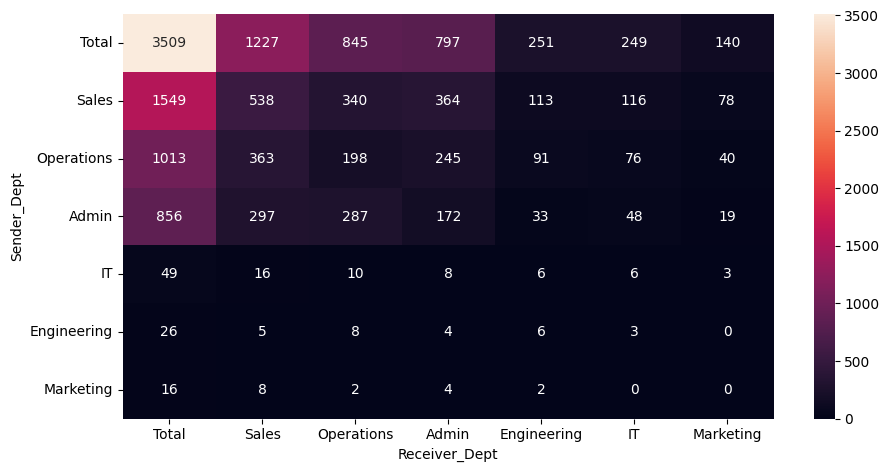

In [ ]:
df_pivot_sorted = df_pivot.sort_values('Total',axis=0,ascending=False).sort_values('Total',axis=1,ascending=False)
display(df_pivot_sorted)
plt.figure(figsize=(7*1.5,7*.75))
sns.heatmap(df_pivot_sorted,annot=True,fmt='d'); plt.show()

By sorting, we pushed more active departments (in terms of both message sending and receiving) to the upper-left corner of the table. We can further tweak our visual using a few simple operations:
- select all rows and columns except **Total**s through indexing, and
- fix the slightly mixed order of the departments in the row and column indices so that department order is the same:

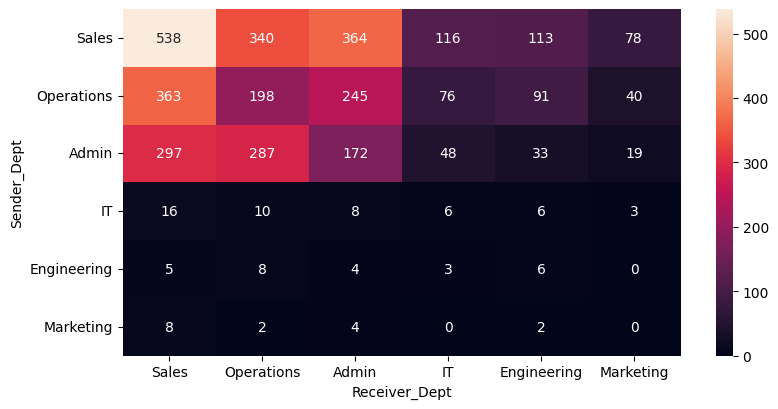

In [ ]:
plt.figure(figsize=(6*1.5,6*.75))
df_pivot_sorted = df_pivot_sorted.iloc[1:,1:]
df_pivot_sorted = df_pivot_sorted[df_pivot_sorted.index]
sns.heatmap(df_pivot_sorted,annot=True,fmt='d'); plt.show()

For **intra-departmental** communication (this is the info in the diagonal cells), we observe that:
- Most messages (538) are sent within **Sales** department
- Then comes **Operations** and **Admin** with 198 and 172 messages respectively
- Amazingly, **Marketing**  did not send any messages within the department. This could be normal though, as marketing people would **not** try to market anything to each other 😊. Following low scorer departments are **Engineering** and **IT**, both with 6 within-department messages.

As for **inter-departmental** communication:
- There are 363 messages from **Operations** to **Sales**, 340 messages from **Sales** to **Operations**. Total message traffic between these two departments is 363+340=703.
- Most messages (364) are sent from **Sales** to **Admin**. The message count in the reverse direction (i.e. from **Admin** to **Sales**) is 297, which is pretty high again (compared to the rest of the counts). Total message traffic between these two departments is 364+297=661.
- Lowest communication activity took place between **Marketing (M)** and **Engineering (E)** (2 messages from M to E, and 0 from E to M), and between **Marketing (M)** and **IT** (0 messages from M to IT, and 3 from IT to M).

Therefore, we may conclude that:
- **Sales** and **Marketing** respectively are the **most** and **least** active department within themselves, and
- **Strongest** and **weakest** communication links are between **Operations** and **Sales** and between **Engineering** and **Marketing** departments, respectively.

Before we leave this section, let's also analyze message data from another simple 😊 global perspective, which is the distribution of total message count of 3509, into to "intra- or within-departmental" and "inter departmental" message counts:

Total message count = 3509
Intra-departmental (i.e. within depts.) message count = 920 (26.22%)
Inter-departmental (i.e. among depts.) message count = 2589 (73.78%)



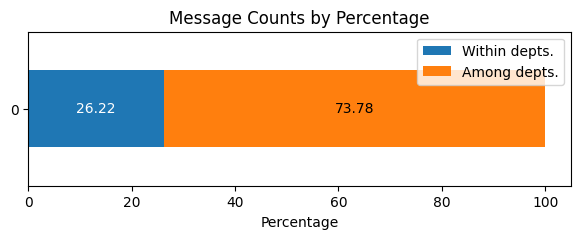

In [ ]:
cnt_matrix = df_pivot_sorted.to_numpy()
total_message_cnt = cnt_matrix.sum()
intra_dept_message_cnt = cnt_matrix.trace()
inter_dept_message_cnt = total_message_cnt-intra_dept_message_cnt
print(f'Total message count = {total_message_cnt}')
perc_cnts = np.round(100*np.array([intra_dept_message_cnt,inter_dept_message_cnt])/total_message_cnt,2)
print(f'Intra-departmental (i.e. within depts.) message count = {intra_dept_message_cnt} ({perc_cnts[0]:.2f}%)')
print(f'Inter-departmental (i.e. among depts.) message count = {inter_dept_message_cnt} ({perc_cnts[1]:.2f}%)\n')
_, ax = plt.subplots(figsize=(7,2))
pd.DataFrame(perc_cnts.reshape(1,-1),columns=['Within depts.','Among depts.']).plot(kind='barh',stacked=True,ax=ax)
ax.annotate(text=f'{perc_cnts[0]:.2f}',xy=(perc_cnts[0]/2,0),c='w',ha='center',va='center')
ax.annotate(text=f'{perc_cnts[1]:.2f}',xy=(perc_cnts[0]+perc_cnts[1]/2,0),ha='center',va='center')
ax.set_xlabel('Percentage'); ax.set_title('Message Counts by Percentage'); plt.show()

## 3. Which employee has the most connections?
We need to first discuss or make clear what connection is. For instance, are we talking about unilateral or unidirectional or one-way 😊 connections? That is, to call or identify employees with id. #s **i** and **j** as connected, is it sufficient to find a message from **i** to **j** or from **j** to **i** in our messages data? ORRRR 😊, do we require a two-way or bilateral or bidirectional 😊 connection, i.e. both (i,j) and (j,i) ordered pairs must be present in messages data? We'll get into these issues in some detail in Section 4, where we present "graph theoretical analysis" of our network.

When we go the "network analysis" phase of our study, we'll see that "number of connections" of a node is the "number of neighbors" it has. This "connection count" for a node is also referred to as the "degree" of a node. More specifically, in graph/network terminology, number of neighbors of a node is defined as the "degree" of the node in an "undirected network" and as the "out-degree" of the node in a "directed network."

We'll now identify the employees (and their departments) with top number of connections (i.e. number of neighbors or "out degree") using "groupby" method. (Later in Section 4, we'll confirm these results/finding using graph theoretical methods.) Then we'll also analyze our data using different "pandas" and "karate" 😊 techniques to rate the employees using several simple metrics such as the number of message they send and receive, and also figure out employees with bilateral connections.

In [ ]:
df_conns_out = df_messages[['sender','receiver']].groupby('sender').nunique().sort_values('receiver',ascending=False)
df_conns_out['Department'] = df_employees2.loc[df_conns_out.index,'department'].values
df_conns_out.index.name='Employee_Id'; df_conns_out.columns = ['Out_Neighbor_Count','Employee_Dept']
print(f'There are {len(df_conns_out)} unique connections, i.e. (sender,receiver) pairs, in the message data.')
df_conns_out = df_conns_out[['Employee_Dept','Out_Neighbor_Count']]
print('Top 10 senders (employees) with most number of outgoing connections (i.e. number of neighbors) are:')
df_conns_out[:10]

There are 85 unique connections, i.e. (sender,receiver) pairs, in the message data.
Top 10 senders (employees) with most number of outgoing connections (i.e. number of neighbors) are:


,Employee_Dept,Out_Neighbor_Count
Employee_Id,,
598,Operations,77
144,Sales,75
128,Sales,71
605,Admin,68
586,Operations,64
389,Sales,58
317,Operations,51
509,Admin,50
337,Sales,39


But this is just one side of the story, regarding number of different connections for message sending or "outgoing" activity. We should also look for number of unique (receiver, sender) ordered pairs which corresponds to "incoming" or message receiving activity. As we'll see later (in Section 4) these two views correspond to "out degree" and "in degree" metrics of nodes, when put our "message data" into a "network" format, using graph theory.

In [ ]:
df_conns_in = df_messages[['sender','receiver']].groupby('receiver').nunique().sort_values('sender',ascending=False)
df_conns_in['Department'] = df_employees2.loc[df_conns_in.index,'department'].values
df_conns_in.index.name='Employee_Id'; df_conns_in.columns = ['In_Neighbor_Count','Employee_Dept']
print(f'There are {len(df_conns_in)} unique connections, i.e. (receiver,sender) pairs, in the message data.')
df_conns_in = df_conns_in[['Employee_Dept','In_Neighbor_Count']]
print('Top 10 receiver (employees) with most number of incoming connections (i.e. number of neighbors) are:')
df_conns_in[:10]

There are 617 unique connections, i.e. (receiver,sender) pairs, in the message data.
Top 10 receiver (employees) with most number of incoming connections (i.e. number of neighbors) are:


,Employee_Dept,In_Neighbor_Count
Employee_Id,,
194,Admin,13
32,Sales,11
249,Admin,9
1283,Admin,8
103,Sales,8
42,Admin,8
105,IT,7
840,Admin,7
598,Operations,7


We can also get summary statistics for **Out_Neighbor_Count** and **In_Neighbor_Count** variables, as follows:

In [ ]:
Out_Degree_reindexed = df_conns_out.Out_Neighbor_Count.reindex(df_employees2.index).fillna(0)
In_Degree_reindexed = df_conns_in.In_Neighbor_Count.reindex(df_employees2.index).fillna(0)
pd.concat((Out_Degree_reindexed,In_Degree_reindexed),axis=1).agg(['min','max','mean','median','count'])

,Out_Neighbor_Count,In_Neighbor_Count
min,0.000000,0.000000
max,77.000000,13.000000
mean,1.718373,1.718373
median,0.000000,1.000000
count,664.000000,664.000000


Note that when we reindex (with the index of all employees obtained via **df_employees2.index**) the **Out_Neighbor_Count** variable which has only 85 values defined for 85 employees sending messages, suddenly becomes defined for all 664 employees. Right after reindexing employees with no outgoing messages are assigned NaN values but via fillna(0) we make fill them with 0, and this operation changes the mean and median values of the variable as one may expect 😊.

In [ ]:
df_conns_out[['Out_Neighbor_Count']].agg(['min','max','mean','median','count'])

,Out_Neighbor_Count
min,1.000000
max,77.000000
mean,13.423529
median,5.000000
count,85.000000


Of course, we have a similar situation for the **In_Neighbor_Count** variable:

In [ ]:
df_conns_in[['In_Neighbor_Count']].agg(['min','max','mean','median','count'])

,In_Neighbor_Count
min,1.000000
max,13.000000
mean,1.849271
median,1.000000
count,617.000000


Luckily, the max values did not change, which help us identify what is what.. 😊 Let's also have a look at the distribution (i.e. histogram) of "neighbor counts" of these employees, as follows:

Let us also see how these unique 85 senders are distributed into different departments:

In [ ]:
df_conns_dept = df_conns_out.Employee_Dept.value_counts().reset_index().rename(columns={'index':'Department','Employee_Dept':'Count'})
print(f'Distribution {len(df_conns_out)} unique senders into different departments:')
df_conns_dept

Distribution 85 unique senders into different departments:


,Department,Count
0,Sales,26
1,Admin,22
2,Operations,19
3,Engineering,8
4,IT,7
5,Marketing,3


We observe that employees from mostly 'Sales', 'Admin', and 'Operations' departments constitute these connections. To be more specific, we can calculate percentage weight of these 3 department among 85 connections as follows:

In [ ]:
sum_3depts, sum_alldepts = df_conns_dept.Count[:3].sum(),df_conns_dept.Count.sum()
print(f'Out of {sum_alldepts} senders, {sum_3depts} (i.e. {sum_3depts/sum_alldepts:.2%}) are from {*df_conns_dept.Department[:3].values,} departments.')

Out of 85 senders, 67 (i.e. 78.82%) are from ('Sales', 'Admin', 'Operations') departments.


We can do a similar analysis for 617 unique receivers to see how those are distributed into different departments:

In [ ]:
df_conns_dept = df_conns_in.Employee_Dept.value_counts().reset_index().rename(columns={'index':'Department','Employee_Dept':'Count'})
print(f'Distribution {len(df_conns_in)} unique senders into different departments:')
display(df_conns_dept)
sum_3depts, sum_alldepts = df_conns_dept.Count[:3].sum(),df_conns_dept.Count.sum()
print(f'Out of {sum_alldepts} senders, {sum_3depts} (i.e. {sum_3depts/sum_alldepts:.2%}) are from {*df_conns_dept.Department[:3].values,} departments.')

Distribution 617 unique senders into different departments:


,Department,Count
0,Sales,146
1,Admin,128
2,Operations,126
3,Engineering,93
4,IT,73
5,Marketing,51


Out of 617 senders, 400 (i.e. 64.83%) are from ('Sales', 'Admin', 'Operations') departments.


### 3.1 Rate messaging activity of employees using "value counts" method
Using the **value_counts()** method on the **sender** and **receiver** columns or variables, we can identify messaging activity (i.e. total message count) at the individual (i.e. employee) level.

We can identify top 10 message senders and visualize the result as a bar graph:

,Employee_Id,Sent_Count,Department
0,605,459,Admin
1,128,266,Sales
2,144,221,Sales
3,509,216,Admin
4,389,196,Sales
5,598,187,Operations
6,317,184,Operations
7,586,180,Operations
8,483,169,Sales
9,725,137,Sales


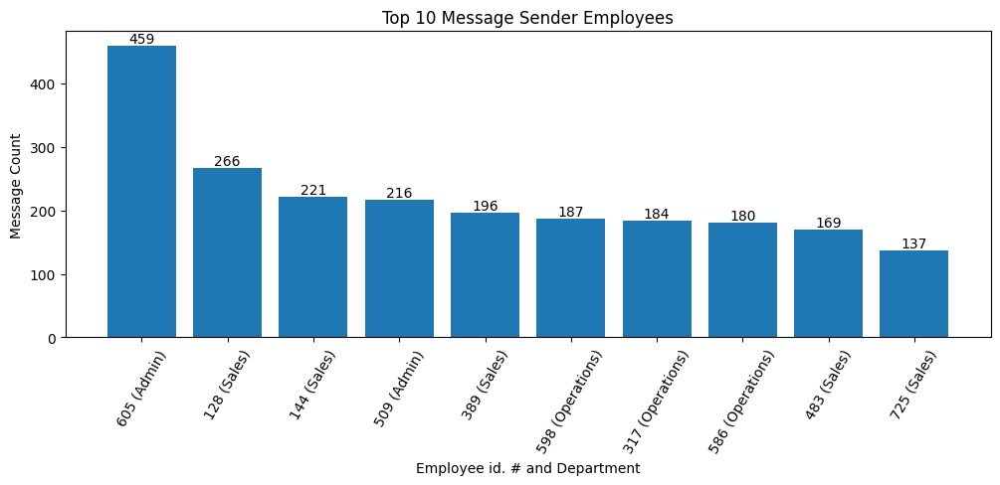

In [ ]:
df_top_senders = df_merged.sender.value_counts()[:10].reset_index()
df_top_senders.columns = ['Employee_Id','Sent_Count']
df_top_senders['Department'] = df_employees2.loc[df_top_senders.Employee_Id,'department'].values
display(df_top_senders)
_, ax = plt.subplots(figsize=(12,4))
bars = ax.bar(range(10),df_top_senders.Sent_Count); ax.bar_label(bars)
plt.xlabel('Employee id. # and Department'); plt.ylabel('Message Count')
xlabel_raw = df_top_senders.iloc[:,[0,2]].values
xlabel_txt = [str(xlabel_raw[i][0])+' ('+xlabel_raw[i][1]+')' for i in range(10)]
plt.xticks(range(10)); ax.set_xticklabels(xlabel_txt,rotation=60)
plt.title('Top 10 Message Sender Employees'); plt.show()

Similarly, we can identify top 10 message **receivers** and visualize the corresponding result as follows:

,Employee_Id,Received_Count,Department
0,281,60,Sales
1,704,54,Operations
2,308,51,Sales
3,236,47,Sales
4,830,47,Sales
5,454,46,Admin
6,32,46,Sales
7,254,44,Sales
8,542,42,Sales
9,103,40,Sales


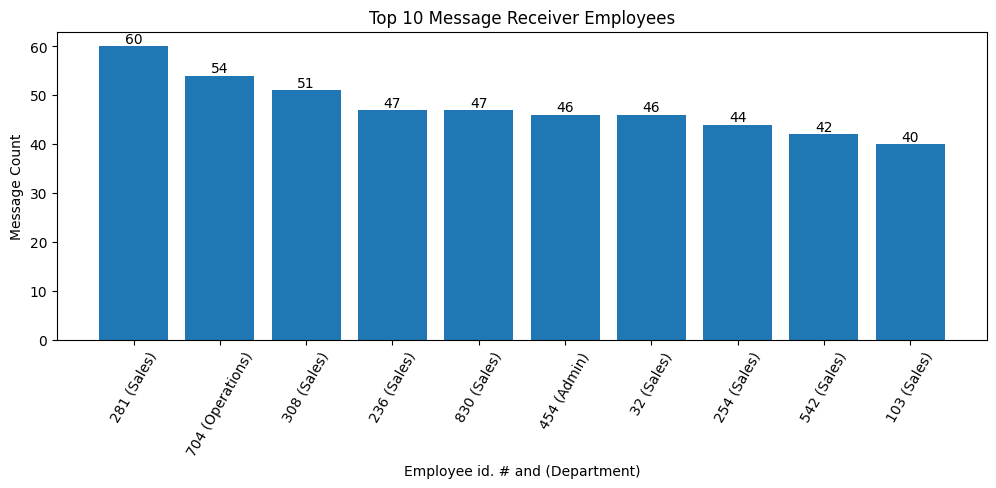

In [ ]:
df_top_receivers = df_merged.receiver.value_counts()[:10].reset_index()
df_top_receivers.columns = ['Employee_Id','Received_Count']
df_top_receivers['Department'] = df_employees2.loc[df_top_receivers.Employee_Id,'department'].values
display(df_top_receivers)
_, ax = plt.subplots(figsize=(12,4))
bars = ax.bar(range(10),df_top_receivers.Received_Count); ax.bar_label(bars)
plt.xlabel('Employee id. # and (Department)'); plt.ylabel('Message Count')
xlabel_raw = df_top_receivers.iloc[:,[0,2]].values
xlabel_txt = [str(xlabel_raw[i][0])+' ('+xlabel_raw[i][1]+')' for i in range(10)]
plt.xticks(range(10)); ax.set_xticklabels(xlabel_txt,rotation=60)
plt.title('Top 10 Message Receiver Employees'); plt.show()

<a id="Sec_3_1"></a>Finally, we note that:

In [ ]:
top_sender_vals,top_recevier_vals = df_top_senders.iloc[0,:].values,df_top_receivers.iloc[0,:].values
print(f'The top message Sender is Employee id. #{top_sender_vals[0]} (from {top_sender_vals[2]} department) with {top_sender_vals[1]} messages')
print(f'The top message Receiver is Employee id. #{top_recevier_vals[0]} (from {top_recevier_vals[2]} department) with {top_recevier_vals[1]} messages')

The top message Sender is Employee id. #605 (from Admin department) with 459 messages
The top message Receiver is Employee id. #281 (from Sales department) with 60 messages


### 3.2 Rate messaging activity of employees using "pivot table" method
Let us create a pivot table to quantify message traffic among all **communicating** (i.e. either sending or receiving) pairs of individuals or employees in the company:

In [ ]:
df_reduced = df_merged[['sender','receiver','department_sender']]
df_reduced.columns = ['Sender','Receiver','Message_Count']
df_pivot = df_reduced.pivot_table(index='Sender',columns='Receiver',aggfunc='count',
                                     margins=True,margins_name='Total',fill_value=0)
df_pivot

Message_Count                                 ...                 \
Receiver             3   6  8   9  12 19 23  26 27 29  ... 1761 1781 1783   
Sender                                                 ...                  
79                   0   0  1   0   0  0  0   0  0  0  ...    0    0    0   
128                  0   0  0   0   1  0  0   0  0  0  ...    0    0    0   
144                  1   0  0   2  11  0  1   0  0  0  ...    1    0    3   
162                  0   0  0   0   0  0  0   0  0  0  ...    0    0    0   
173                  0   0  0   0   0  0  0   0  0  0  ...    0    0    0   
...                ...  .. ..  ..  .. .. ..  .. .. ..  ...  ...  ...  ...   
1802                 0   0  0   0   0  0  0   0  0  0  ...    0    0    0   
1807                 4   0  0   0   0  0  0   0  0  0  ...    0    0    0   
1879                 0   0  0   0   0  0  0   0  0  0  ...    0    0    0   
1881                 0   0  0   0   0  0  0   0  0  0  ...    0    0    0   
Total               11  10  1  22  12  2  1  16  3  6  ...    1    4    7   

                                              
Receiver 1792 1796 1801 1830 1839 1890 Total  
Sender                                        
79          0    0    0    0    0    0    13  
128         0    0    0    0    0    0   266  
144         0    0    0    0    0    0   221  
162         0    0    0    0    0    0    11  
173         0    0    0    0    0    0    10  
...       ...  ...  ...  ...  ...  ...   ...  
1802        0    0    2    0    0    0     2  
1807        0    0    0    0    0    0    15  
1879        0    0    0    0    0    0     4  
1881        0    0    0    0    0    0    27  
Total       2    2    4    2    8    2  3509  

[86 rows x 618 columns]

Let us sort the pivot table according to the **Total** message count along both row and column dimensions in descending order:

In [ ]:
df_pivot_sorted = df_pivot.sort_values(('Message_Count','Total'),axis=0,ascending=False).sort_values('Total',axis=1,ascending=False)
df_pivot_sorted

Message_Count                                      ...             \
Receiver         Total 281 704 308 830 236 454  32 254 542  ... 825 70 832   
Sender                                                      ...              
Total             3509  60  54  51  47  47  46  46  44  42  ...   1  1   1   
605                459   0  50   2  19   0   0  18  23   0  ...   0  0   0   
128                266   0   0   0   0  23   0   7   0  15  ...   0  0   0   
144                221   1   0   0   0   0   0   2   0   0  ...   0  0   0   
509                216   0   0   0   0   7  36   0   0   0  ...   0  0   0   
...                ...  ..  ..  ..  ..  ..  ..  ..  ..  ..  ...  .. ..  ..   
186                  1   0   0   0   0   0   0   0   0   0  ...   0  0   0   
1605                 1   0   0   0   0   0   0   0   0   0  ...   0  0   0   
1569                 1   0   0   0   0   0   0   0   0   0  ...   0  0   0   
1140                 1   1   0   0   0   0   0   0   0   0  ...   0  0   0   
977                  1   0   0   0   0   0   0   0   0   0  ...   0  0   0   

                                      
Receiver 844 870 872 883 908 913 805  
Sender                                
Total      1   1   1   1   1   1   1  
605        0   0   0   0   0   0   0  
128        0   0   0   0   0   0   0  
144        0   0   0   0   0   0   1  
509        0   0   1   0   0   0   0  
...       ..  ..  ..  ..  ..  ..  ..  
186        0   0   0   0   0   0   0  
1605       0   0   0   0   0   0   0  
1569       0   0   0   0   0   0   0  
1140       0   0   0   0   0   0   0  
977        0   0   0   0   0   0   0  

[86 rows x 618 columns]

Due to sorting, more active **senders** and **receivers** are respectively pushed towards **up** and **left** in the table. Therefore, employees with ids in the upper-left corner of the table are communicating relatively more frequently.

Each **cell** (**i** = 'row index', **j** = 'column index') in this table or **matrix** shows the number of messages **sent** by Employee id. #**i** and **received** by Employee id. #**j**.

We can now make a heatmap of this matrix, however before doing so, we need to take care of a few simple issues. We first note that column index of **df_pivot_sorted** is multi-index (or multi-level):

In [ ]:
df_pivot_sorted.columns[:5]

MultiIndex([('Message_Count', 'Total'),
            ('Message_Count',     281),
            ('Message_Count',     704),
            ('Message_Count',     308),
            ('Message_Count',     830)],
           names=[None, 'Receiver'])

Further, relatively high values in the **Total** row and column of **df_pivot_sorted** may shadow other counts in the table. Therefore, we will first subset (by **iloc** indexing) **df_pivot_sorted** table by selecting all the rows and columns from index 1 till the end (i.e. we are selecting all the cells except the ones in the 1st row and 1st column, which are **Total**s) and call the resultant dataframe **df_A**, for brevity. Then we will flatten multi-index column labels of **df_A**, to have better-looking tick labels on the heatmap:

In [ ]:
df_A = df_pivot_sorted.iloc[1:,1:]; df_A.columns = df_A.columns.get_level_values(1)
df_A.iloc[:5,:5]

Receiver,281,704,308,830,236
Sender,,,,,
605,0,50,2,19,0
128,0,0,0,0,23
144,1,0,0,0,0
509,0,0,0,0,7
389,0,0,0,26,13


Finally 😊, we are ready to visualize the resultant sorted counts sub-table, namely **df_A**, as a heatmap:

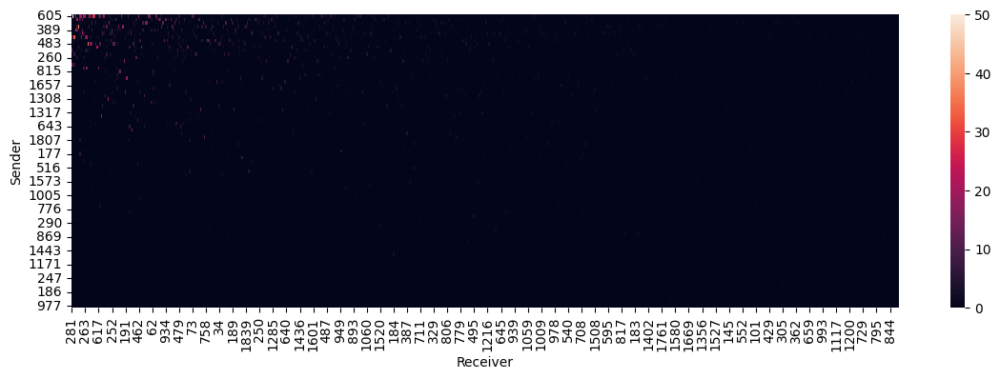

In [ ]:
plt.figure(figsize=(14,4))
sns.heatmap(df_A); plt.show()

This visual is neither very impressive nor informative, as it is mostly dark 😊. Due to the high number of cells and a relatively small plotting space (i.e. determined by screen or paper size), each cell has a very tiny or small area and this makes them difficult to see. Further, high message counts, which appear only in a limited of number of cells, are still blocking our view. We can try compressing the range of the counts using a smart log transform, namely **np.log1p()**, that also gets around the "log of 0 problem", as follows:

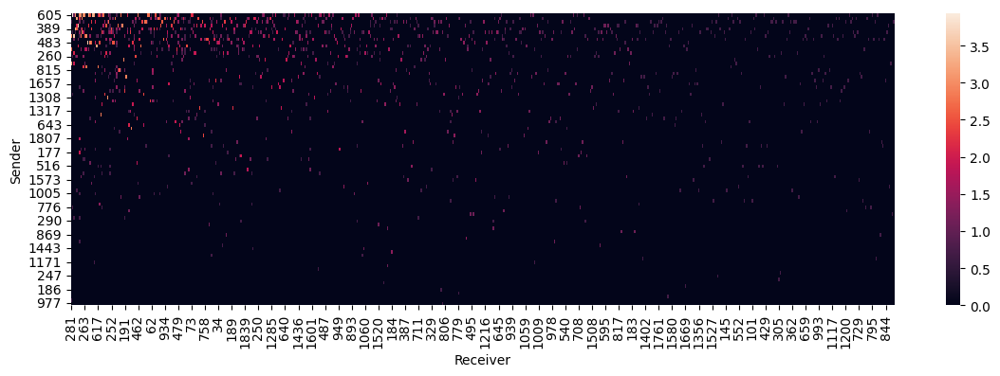

In [ ]:
plt.figure(figsize=(14,4))
sns.heatmap(np.log1p(df_A)); plt.show()

Yes, we have a relatively better view or visual now, as we can somewhat see more active cells, highlighted with reddish colors. If we compare the colorbars, we note that, in the previous heatmap the range of the cell values was around 50, whereas in the current heatmap it is around 4, due to the log compression.

We can take one more step while visualizing the numbers in this table as a heatmap and only look for **existence of connections** by checking if the message count between Employee #**i** to Employee #**j** is greater than zero, as follows:

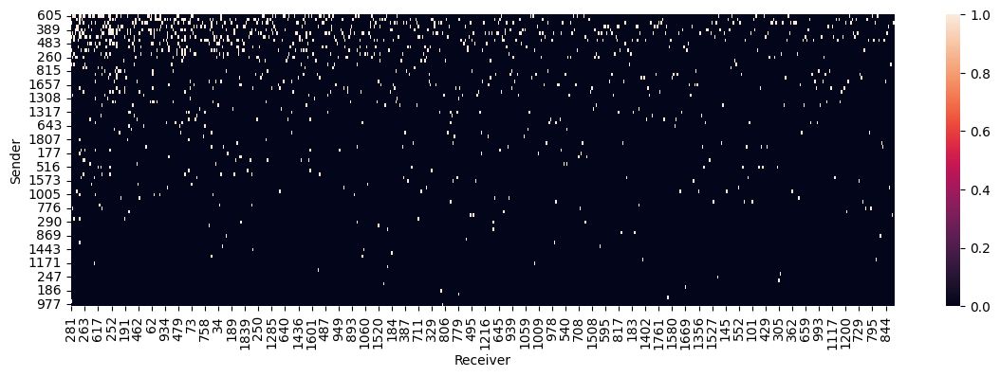

In [ ]:
plt.figure(figsize=(14,4))
sns.heatmap(df_A>0); plt.show()

We have a much better view now, from which we can even 😊 visually identify top message **sender** and **receiver** Employee id.s as #**605** and #**281** respectively.

However, let us also **programmatically** extract top sender and receiver id. information (along with the respective message counts) from the sorted pivot table as follows:

In [ ]:
# Zoom into the upper left corner of the sorted counts pivot table (df_pivot_sorted)
# and call the resultant small subtable as B
B = df_pivot_sorted.iloc[:5,:5]; B.columns = B.columns.get_level_values(1)
display(B)
first_col_vals = B.iloc[[1],0].reset_index().values.reshape(-1)
first_row_vals = B.iloc[0,[1]].reset_index().values.reshape(-1)
dept_sender = df_employees2.loc[first_col_vals[0],'department']
dept_receiver = df_employees2.loc[first_row_vals[0],'department']
print(f'Top message {B.index.name} is Employee id. #{first_col_vals[0]} (from {dept_sender} department) with {first_col_vals[1]} messages')
print(f'Top message {B.columns.name} is Employee id. #{first_row_vals[0]} (from {dept_receiver} department) with {first_row_vals[1]} messages')

Receiver,Total,281,704,308,830
Sender,,,,,
Total,3509,60,54,51,47
605,459,0,50,2,19
128,266,0,0,0,0
144,221,1,0,0,0
509,216,0,0,0,0


Top message Sender is Employee id. #605 (from Admin department) with 459 messages
Top message Receiver is Employee id. #281 (from Sales department) with 60 messages


Note that we've obtained the same results with those of [**Section 3.1**](#Sec_3_1).
### 3.3 Find top (sender, receiver) employee pairs with maximum message count
We can also look for top message (sender, receiver) pairs by message count. We will first do this using "value counts" and then using "pivot table" methods.

#### 3.3.1 Top (sender, receiver) employee pairs using "value counts"
We can easily identify top 10 (sender, receiver) employee pairs using "value counts" method as follows:

In [ ]:
df_pairs_cnts = df_messages.value_counts(['sender','receiver']).reset_index()
df_pairs_cnts.columns = ['Sender','Receiver','Count']
print(f'We have {len(df_pairs_cnts)} unique (sender,receiver) pairs in messages data.')
print(f'First 10 pairs and corresponding message counts are as follows:')
df_pairs_cnts[:10]

We have 1141 unique (sender,receiver) pairs in messages data.
First 10 pairs and corresponding message counts are as follows:


,Sender,Receiver,Count
0,605,704,50
1,509,454,36
2,483,821,35
3,317,308,33
4,605,734,29
5,332,281,27
6,389,830,26
7,725,1260,24
8,605,272,24
9,128,236,23


We can argue that these (sender, receiver) employee pairs have the "strongest connection" in the network, considering the relatively high message traffic (i.e. number of messages) from "sender to receiver." We can update this table by adding the important "department" info as follows:

In [ ]:
df_pairs_cnts['Sender_Dept'] = df_employees2.loc[df_pairs_cnts.Sender,'department'].values
df_pairs_cnts['Receiver_Dept'] = df_employees2.loc[df_pairs_cnts.Receiver,'department'].values
df_pairs_cnts[:10]

,Sender,Receiver,Count,Sender_Dept,Receiver_Dept
0,605,704,50,Admin,Operations
1,509,454,36,Admin,Admin
2,483,821,35,Sales,Sales
3,317,308,33,Operations,Sales
4,605,734,29,Admin,Sales
5,332,281,27,Operations,Sales
6,389,830,26,Sales,Sales
7,725,1260,24,Sales,Admin
8,605,272,24,Admin,Operations
9,128,236,23,Sales,Sales


#### 3.3.2 Top (sender, receiver) employee pairs using "pivot table"
We can also try to identify the (**sender**, **receiver**) pair of employees that has the **maximum message count**. For this purpose, we will again use table **df_A** (a sub-table of **df_pivot_sorted** without the **Total**s) whose heatmap we were playing with 😊, pardon displaying in Section 3.2.

Let us first refresh our memory about table **df_A** by displaying its first few rows and columns, next we find its maximum value:

In [ ]:
display(df_A.iloc[:5,:10])
max_df_A = df_A.to_numpy().max()
print(f'\n\tThe maximum message count in the pivot table is {max_df_A}')

Receiver,281,704,308,830,236,454,32,254,542,103
Sender,,,,,,,,,,
605,0,50,2,19,0,0,18,23,0,19
128,0,0,0,0,23,0,7,0,15,0
144,1,0,0,0,0,0,2,0,0,1
509,0,0,0,0,7,36,0,0,0,0
389,0,0,0,26,13,1,0,2,9,0



	The maximum message count in the pivot table is 50


From the table display above, it is already apparent that the maximum count 50 appears at the cell with row-index (i.e. Sender id. #) = 605 and column-index = (i.e. Receiver id. #) 704. We can also programmatically obtain the row and column indices for max_df_A and get 'department' info for employees with these indices, as follows:

In [ ]:
idxmax_df_A = df_A.where(df_A==max_df_A).dropna(how='all').dropna(axis=1)
display(idxmax_df_A)
i,j = idxmax_df_A.index[0],idxmax_df_A.columns[0]
dept_i,dept_j = df_employees2.loc[i,'department'],df_employees2.loc[j,'department']
print(f'The maximum number of messages are sent\n\tfrom Employee id. #{idxmax_df_A.index.values[0]} ({dept_i})\n\tto Employee id. #{idxmax_df_A.columns.values[0]} ({dept_j})\nThe maximum message count is {max_df_A}')

Receiver,704
Sender,
605,50.0


The maximum number of messages are sent
	from Employee id. #605 (Admin)
	to Employee id. #704 (Operations)
The maximum message count is 50


We can also get other top pairs (in terms of message count in out pivot table **df_A**) using the following little helper function to deal with (matrix) indices of top values:

In [ ]:
def n_largest_indices(cnt_mtrx,n):
  flt_mtrx = cnt_mtrx.flatten()
  idxs = np.argpartition(flt_mtrx,-n)[-n:]
  idxs = idxs[np.argsort(-flt_mtrx[idxs])]
  return np.unravel_index(idxs,cnt_mtrx.shape)

Let us, for instance, return top 10 entries from the message count pivot matrix, along with the department info associated with those entries: 

In [ ]:
idxs = n_largest_indices(df_A.to_numpy(),10)
df_top_pairs = pd.DataFrame([(df_A.index[row_idx],df_A.columns[col_idx],df_A.iloc[row_idx,col_idx]) for row_idx,col_idx in zip(idxs[0],idxs[1])])
df_top_pairs.columns = ['Sender','Receiver','Count']
df_top_pairs['Sender_Dept'] = df_employees2.loc[df_top_pairs.Sender,'department'].values
df_top_pairs['Receiver_Dept'] = df_employees2.loc[df_top_pairs.Receiver,'department'].values
df_top_pairs

,Sender,Receiver,Count,Sender_Dept,Receiver_Dept
0,605,704,50,Admin,Operations
1,509,454,36,Admin,Admin
2,483,821,35,Sales,Sales
3,317,308,33,Operations,Sales
4,605,734,29,Admin,Sales
5,332,281,27,Operations,Sales
6,389,830,26,Sales,Sales
7,725,1260,24,Sales,Admin
8,605,272,24,Admin,Operations
9,605,317,23,Admin,Operations


We happily 😊 note that above results are exactly 😊 the same (except the last row 🤫) as the ones obtained in Section 3.3.1. Why is the last row different? Because we have several (sender, receiver) pairs with message count 23, as we see below. Thank God, that was a relief! 😊


In [ ]:
df_pairs_cnts[8:13]

,Sender,Receiver,Count,Sender_Dept,Receiver_Dept
8,605,272,24,Admin,Operations
9,128,236,23,Sales,Sales
10,605,317,23,Admin,Operations
11,605,254,23,Admin,Sales
12,605,830,19,Admin,Sales


### 3.4 Identify "both-way" communicating employees using matrix manipulation
In the heatmaps above, we have visualized matrix **df_A** which is a  **sub-matrix** of the sorted counts pivot table **df_pivot_sorted**. Let us check the shape of **df_A** 😊 to refresh our weak 😊 memory again:

In [ ]:
df_A.shape

(85, 617)

Row (85) and column (617) sizes of **df_A** respectively correspond to the number of unique message **sender** and **receiver** employees. It is clear from its shape that **df_A** is **not symmetric**, as a **non-square** matrix (i.e. a matrix whose row and column size does not match) cannot be symmetric. Even if **df_A** was square, we should still have the following condition satisfied for symmetricity:
```
If df_A(i,j)>0 (i.e. Emp.id.#i sends at least 1 message to Emp.id.#j)
Then df_A(j,i) must also be >0 (i.e. Emp.id.#j sends at least 1 message to Emp.id.#i)
or vice versa
```
That is, if both (**i**, **j**) and (**j**, **i**) cells are active, it means there is a **both-way** or **two-way** (or **bilateral**) communication link between the employee id. #**i** and employee id. #**j**.

Using numpy array/matrix manipulations, we can find out the number of **both-way** communicating pairs of employees, as follows (please follow the comments for details):

In [ ]:
# Let us first identify common values in row and column indices of the datafame df_A
common_idxs = set(df_A.index) & set(df_A.columns)
print(f'There are {len(common_idxs)} "common indices" between senders (row) and receivers (column) indices, which are:\n{*sorted(common_idxs),}')
# Subset df_A using common_idxs along both row and column directions
# and check if cell values are greater than 0, call the resultant dataframe as df_M
df_M = df_A.loc[common_idxs,common_idxs]>0
# Take "logical and" of df_M and its transpose (df_M.T) to see
# if both (i,j) and (j,i) cells are active
# and subset resultant matrix using lower triangular operation np.tril() and sum entries
print(f'The number of "both-way" communicating pairs (i.e. connections or links) among these employees is {np.tril(df_M & df_M.T,-1).sum()}')
# Sanity check: This set must be same as the set obtained by intersecting senders and receivers sets found in Section 1.3
print(f'Is "common indices" set equal to the intersection of "senders" and "receivers" sets (of Section 1.3): {common_idxs == (senders & receivers)}')

There are 38 "common indices" between senders (row) and receivers (column) indices, which are:
(79, 128, 144, 221, 247, 260, 290, 317, 332, 337, 370, 386, 389, 408, 422, 469, 509, 586, 598, 605, 698, 734, 752, 815, 908, 1021, 1028, 1080, 1097, 1142, 1171, 1299, 1317, 1393, 1500, 1510, 1646, 1665)
The number of "both-way" communicating pairs (i.e. connections or links) among these employees is 27
Is "common indices" set equal to the intersection of "senders" and "receivers" sets (of Section 1.3): True


Let us call the set of employees with id. #s in "common indices" set as "good communicators" and obtain department info for these people:

In [ ]:
df_good_comm = pd.DataFrame(common_idxs,columns=['id'])
df_good_comm['department'] = df_employees2.loc[common_idxs,'department'].values
df_good_comm.head()

,id,department
0,128,Sales
1,1665,Operations
2,386,Admin
3,1028,Admin
4,260,Operations


We can now make a bar graph of distribution (i.e. counts) of "good communicators" by department, as follows:

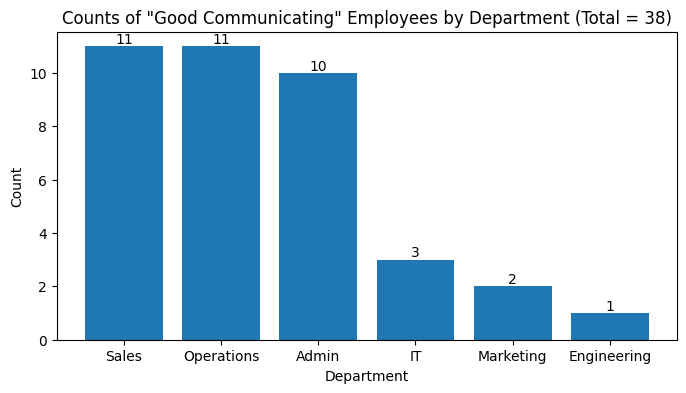

In [ ]:
val_cnts = df_good_comm.department.value_counts()
_, ax = plt.subplots(figsize=(8,4))
bars = ax.bar(val_cnts.index,val_cnts); ax.bar_label(bars)
plt.xlabel('Department'); plt.ylabel('Count')
plt.title('Counts of "Good Communicating" Employees by Department (Total = 38)'); plt.show()

No wonder, "in line" with our previous observations, Sales and Operations (with 11 employees each) at the top two positions, in terms of number of employees in the "good communicators" network. Conversely, Marketing (2 employees) and Engineering (1 employee) departments are at the bottom two positions, in terms of number of employees in the "good communicators" network\.

Let us now figure out **both-way** communicating pairs of employees, as follows:

In [ ]:
# Identify both-way communicating pairs by collecting indices of nonzero items in the triangular matrix
# via a double (or rather 1.5 :) for loop running on row (i) and (half :) col (j) indices
TM = np.tril(df_M & df_M.T,-1)
idxs, ij_list = list(common_idxs), []
for i in range(len(common_idxs)):
    for j in range(i):
        if TM[i,j]:
            ij_list.append([idxs[i],idxs[j]])
df_both_way_pairs = pd.DataFrame(np.unique(np.sort(ij_list,axis=1),axis=0),columns=['Sender','Receiver'])
df_both_way_pairs

,Sender,Receiver
0,79,260
1,128,221
2,128,598
3,128,1510
4,144,290
5,144,1500
6,260,386
7,260,509
8,260,1028
9,290,408


We observe that there 27 pairs of employees connected "both-ways" or communicating bilaterally. Let us now get id. #s of employees in this "both-way" communicators list, by collecting unique id.#s from **df_both_way_pairs**:

In [ ]:
both_way_comm = set(df_both_way_pairs.values.flatten())
print(f'There are {len(both_way_comm)} employees in the "both-way" communicators list, whose id.#s are:\n{*sorted(both_way_comm),}')

There are 31 employees in the "both-way" communicators list, whose id.#s are:
(79, 128, 144, 221, 260, 290, 317, 332, 337, 386, 389, 408, 422, 469, 509, 586, 598, 605, 734, 752, 908, 1028, 1097, 1142, 1171, 1299, 1393, 1500, 1510, 1646, 1665)


Let us also make a Venn diagram of "good communicators" (i.e. employees with id. #s in the "common indices" set) and its subset "both-way" communicators:

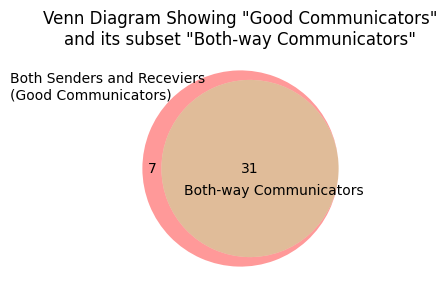

In [ ]:
plt.figure(figsize=(6,3))
vd = venn2([common_idxs,both_way_comm],set_labels = ('',''))
vd.set_labels[0] = plt.text(-1.35,.4,'Both Senders and Receviers\n(Good Communicators)')
vd.set_labels[1] = plt.text(-.35,-.15,'Both-way Communicators')
vd.subset_labels[1].set_text('') # vd.subset_labels[1].set_visible(False)
plt.title('Venn Diagram Showing "Good Communicators"\nand its subset "Both-way Communicators"'); plt.show()

We observe that 7 elements (i.e. employees) out of 38 in the "good communicators" set are not involved in both-way communication activity:

In [ ]:
diff_set = common_idxs-both_way_comm
print(f'The list of {len(diff_set)} employees who are both in "senders" and "receivers" set (i.e. a "good communicator")\nbut not included in the "both-way communication network" are: {*sorted(diff_set),}')

The list of 7 employees who are both in "senders" and "receivers" set (i.e. a "good communicator")
but not included in the "both-way communication network" are: (247, 370, 698, 815, 1021, 1080, 1317)


### 3.5 Identify "both-way" communicating employees using self-merge
We can also identify bilateral connections using a self-merge operation. For this purpose (and to make things easier to understand and/or follow), let us first define **df2**, a sub-table of **df_merged**, which only contains 'sender' and 'receiver' variables consisting of **unique** sender and receiver employee id. # pairs, as follows:

In [ ]:
df2 = df_merged.iloc[:,:2].drop_duplicates().reset_index(drop=True)
print(f'df2 (which has {len(df2)} rows) is a sub-table of df_merged (which has {len(df_merged)} rows)\nFirst few rows of df2 are:')
df2.head()

df2 (which has 1141 rows) is a sub-table of df_merged (which has 3509 rows)
First few rows of df2 are:


,sender,receiver
0,79,48
1,144,48
2,79,63
3,332,63
4,337,63


We can identify existence of **both-way** communicating Employee id. pairs **(i,j)** and **(j,i)** in **df2** by self-merging **df2** onto itself, we call the resultant dataframe **df3**:

In [ ]:
df3 = df2.merge(df2,left_on=['sender','receiver'],right_on=['receiver','sender'],suffixes=('_i','_j'))
print(f'Result of self-merge of df2 (onto itself) is dataframe df3 (which has {len(df3)} rows)\nFirst few rows of df3 are:')
df3.head()

Result of self-merge of df2 (onto itself) is dataframe df3 (which has 54 rows)
First few rows of df3 are:


,sender_i,receiver_i,sender_j,receiver_j
0,79,260,260,79
1,386,260,260,386
2,509,260,260,509
3,1028,260,260,1028
4,260,386,386,260


Note that we have changed the other of 'sender' and 'receiver' keys in the **left_on** and **right_on** arguments on which the **merge** or **join** operation is based. In each row of **df3**, the order of 'sender' and 'receiver' columns with '\_i' and '\_j' subscripts are reversed. That is, **df3** lists all the cases where both ('sender_i', 'receiver_j') and ('sender_j, receiver_i') pairs exist in **df2** and, as indicated above, we have 54 such cases.

We note that if pair (i,j) is a communicating pair, pair (j,i) also is and due to self-merge, pair (i,j) will appear twice in df3:
- once as (i,j)-(j,i) and
- a second time and as (j,i)-(i,j)

For instance, at the row of df3 with index=1, we see pair (386,260) and its mirror (260,386), because it is a both-way communicating pair. However, since (260,386) pair is also in df3 (see the row with index=4), during the merge, this pair and its mirror will get also caught 😊 or selected. Therefore, we will need to pay attention to this "little duplication" issue.

Let us further analyze cases in **df3** using simple pandas and numpy manipulations and find out who these highly **inter-twined** group of employees are. As the last two columns of **df3** are symmetrical to the first two, we will first "subset" **df3** by selecting first two columns and then convert the resultant sub-table into a numpy array:

With the following "one line of code" we will accomplish many tasks at once:
1. we first "subset" **df3** by selecting first two columns (since the last two columns of **df3** are symmetrical to the first two), and then
2.	we sort the resultant sub-table in column direction (i.e. axis = 1), and then
3.	we sort the result by columns [0,1], and then
4.	we drop duplicate rows, and then
5.	we reset index so that we can visualize/count the remaining pairs easily..
Amazing but true! Thanks to the "operator chaining" in the python ecosystem.. Actually, it is more than a chain, it is a big train! 😊



In [ ]:
df_both_way_pairs2 = df3[['sender_i','receiver_i']].apply(np.sort,axis=1,result_type='expand').sort_values(by=[0,1]).drop_duplicates().reset_index(drop=True)
df_both_way_pairs2.columns=['Sender','Receiver']
df_both_way_pairs2.head()

,Sender,Receiver
0,79,260
1,128,221
2,128,598
3,128,1510
4,144,290


Let us check whether **both_way_pairs** of previous Section (i.e. Section 3.4) and **both_way_pairs2** that we have just found using merge are the same?

In [ ]:
df_both_way_pairs.equals(df_both_way_pairs2)

True

Before we close this section, we finally
- identify list of employees involved in the "both-way" communication by collecting unique elements in **df_both_way_pairs2** using np.unique(), we call this set as **both_way_comm2**, and also
- check if **both_way_comm** (i.e. list of employees in the "both-way" communication network of Section 3.4) and **both_way_comm2** that we have just found are the same

as follows:


In [ ]:
both_way_comm2 = set(np.unique(df_both_way_pairs2.values))
print(f'There are {len(both_way_comm2)} employees in the "both-way" communication network, whose id.#s are:\n{*sorted(both_way_comm2),}')
print(f'Are the two lists (both_way_comm and both_way_comm2) equal? {both_way_comm==both_way_comm2}')

There are 31 employees in the "both-way" communication network, whose id.#s are:
(79, 128, 144, 221, 260, 290, 317, 332, 337, 386, 389, 408, 422, 469, 509, 586, 598, 605, 734, 752, 908, 1028, 1097, 1142, 1171, 1299, 1393, 1500, 1510, 1646, 1665)
Are the two lists (both_way_comm and both_way_comm2) equal? True


## 4. Network analysis of communication within company
We can model the communication (i.e. message sending and receiving) activity within this multinational company using a "graph theory" concept called **network**, where each **employee** is a **node** and each **message** sent from node **i** to node **j** represents an **edge** or connection between nodes **i** and **j**. We can represent these two main items (i.e. **node** and **edge** info) contained in a network in several ways:
- In tabular form, using a list (e.g. table) of edges (node information can be given explicitly or deduced from edges),
- Mathematically, using an **adjacency matrix** $A$, which is defined as: if there is a connection (edge) from node $i$ to node $j$ in the network then $A_{ij} = 1$, else $A_{ij} = 0$, where $i,j = 1,2,...,n$ and $n$ is the number of nodes in the network, or
- Pictorially, by drawing a graph consisting of typically **circles** for **nodes** and **lines** for **edges**.
In our case, the rows of **messages** dataframe constitute an edge list, where **sender** is the **from** node and **receiver** is the **to** node.

If we have a network with a few nodes, visual inspection of the graph representation of the network may reveal all aspects of it. However, for analysis of large networks (with possibly thousands of nodes), we rely on a solid mathematical framework called **graph theory**. For instance, network analysis (powered with graph theory) has been successfully applied to many business optimization problems such as shortest path, travelling salesman, and spanning trees.

Therefore, once we formulate or represent messaging activity as a network, we can utilize many well-established tools or algorithms of "network analysis" to quantify importance of each node using many different criteria or perspectives (not only connection or message count). Then, we can identify relatively import nodes (i.e. employees) that play a critical role in the communication. Through "network analysis," we can also investigate whether there are **communities** or **cliques** in the communication network of this multinational company.

We have come a long way by table exploration and visualization using **pandas** and **seaborn** packages. Let us now gear up to **network analysis** using another popular package, namely **networkx** (imported as **nx**). To form or define a network from its edges, we use **from_pandas_edgelist()** utility of **nx** as follows:

### 4.1 Define "multi-directed" network from its edges
We've come a long way by table exploration and visualization using **pandas** and **seaborn** packages. Let us now gear up to network analysis using another popular package, namely **networkx** (imported as **nx**).
We will first define an initial "multi-directed" network (from its edges readily given in **df_merged**) using **from_pandas_edgelist()** utility of **nx**. In a "directed" network, edges are directed, as the name implies. 😊 That is, "edge" refers to an "ordered pair" of nodes in a directed network. For instance, two edges **(u, v)** and **(v, u)**, involving nodes **u** and **v**, are considered different. However, our "message data" (which is available in **df_messages** or **df_merged**) include many instances of **messages** (i.e. **edges**) between "sending" and "receiving" **nodes** (i.e. **employees**). Therefore, for proper translation of "message data" into a network, we need to use a "multi-directed" type of network, which can store multiple edges between nodes, as follows:

In [ ]:
initial_Ntwrk = nx.from_pandas_edgelist(df_merged,source='sender',target='receiver',create_using=nx.MultiDiGraph())
print('initial_Ntwrk is a',nx.info(initial_Ntwrk))

initial_Ntwrk is a MultiDiGraph with 664 nodes and 3509 edges


Note that we could have also generated the **initial_Ntwrk** (from its edges) using the **df_messages** table. The two networks generated using these two tables would be **isomorphic** to each other, as the edge information, i.e. (sender, receiver) pairs and their counts, are the same in these tables (just the order is different.) However, since the edges are readily sorted in (sender id. #, receiver id. #) order due to merging, defining the network using the edges in **df_merged** table is a better idea, as we will appreciate soon, while graphically drawing/visualizing our network.

### 4.2 Convert "multi-directed" network to regular "directed" network with metadata
We have defined our network initially as a **MultiDiGraph** which allows multiple directed edges between nodes. Let us convert this "Multi Directed Graph" (MDG) into a simple "Directed Graph" (DG) by assigning "count" of multiple edges in MDG as **edge** metadata or attribute in DG. We will sensibly 😊 call this "edge attribute" in DG as **weight**, as it indicates strength of "directed connection" between underlying pair of nodes. Hence, our network 
(that we named as **Ntwrk** 😊) we will be an instance of plain **DiGraph** (i.e. directed graph) class with "weighted" edges, instead of an instance of **MultiDiGraph** class, for which some algorithms (that we will need in subsequent steps of our analysis) are not implemented.

In [ ]:
Ntwrk = nx.DiGraph() # Start with an empty directed graph
for u,v,data in initial_Ntwrk.edges(data=True): # Populate edges of Ntwrk (from edges of initial_Ntwrk)
  w = data['weight'] if 'weight' in data else 1 # by also including "edge count" as "weight" meta
  if Ntwrk.has_edge(u,v):
    Ntwrk[u][v]['weight'] += w
  else:
    Ntwrk.add_edge(u,v,weight=w)
print('Ntwrk is a',nx.info(Ntwrk))
# Let us collect weight values for all edges in a list 
weights = [Ntwrk[u][v]['weight'] for u,v in Ntwrk.edges]
# Sanity check
print(f'Are number of edges in initial_Ntwrk (directed multi graph) and sum of "edge weights" in Ntwrk (directed graph) equal? {sum(weights)==len(initial_Ntwrk.edges)}')

Ntwrk is a DiGraph with 664 nodes and 1141 edges
Are number of edges in initial_Ntwrk (directed multi graph) and sum of "edge weights" in Ntwrk (directed graph) equal? True


We note that number of edges are shrunk from 3509 to 1141 when we converted our network from MultiDiGraph (MDG) to DiGraph (DG) type. This is because if there are 10 directed edges between nodes u and v (corresponding to 10 messages sent from u to v) in MDG, it will appear as just 1 directed edge in DG.
Actually, we can see specifics or details of this MDG to DG conversion from the following (sender,recevier) paired value counts table that we've found in Section 3.3.1:

In [ ]:
df_pairs_cnts.head()

,Sender,Receiver,Count,Sender_Dept,Receiver_Dept
0,605,704,50,Admin,Operations
1,509,454,36,Admin,Admin
2,483,821,35,Sales,Sales
3,317,308,33,Operations,Sales
4,605,734,29,Admin,Sales


For instance,\
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 50 edges between nodes 605 and 704 in MDG are shrunk to 1 in DG,\
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 36 edges between nodes 509 and 454 in MDG are shrunk to 1 in DG,\
and so on.
#### 4.2.1 "Edge weight" distribution of **Ntwrk**
While at it, let's also see the distribution of "edge weights" in our directed **Ntwrk**. As "edge weights" indicate how strongly nodes are connected to each other, this histogram provides an important insight into the global "connectedness" status of our network. (We'll first create/define a little helper function named **custom_histogram** to make custom histograms plots 😊, with the mean and median values of the underlying variable overlaid, as we'll need to do similar plots several times.)

In [ ]:
def custom_histogram(inp_array,num_bins,ax,ax_xlabel,ax_ylabel,ax_title):
  cnts_hist,bins_hist = np.histogram(inp_array,bins=num_bins)
  ax.stairs(cnts_hist,bins_hist)
  arr_mean,arr_median = np.mean(inp_array),np.median(inp_array)
  ax.set_xlabel(ax_xlabel); ax.set_ylabel(ax_ylabel); ax.set_title(ax_title);
  ax.axvline(arr_mean,c='r',linestyle='--',label=f'Mean ({arr_mean:.3f})')
  ax.axvline(arr_median,c='g',linestyle='--',label=f'Median ({arr_median:.3f})')
  ax.legend(loc='upper right')

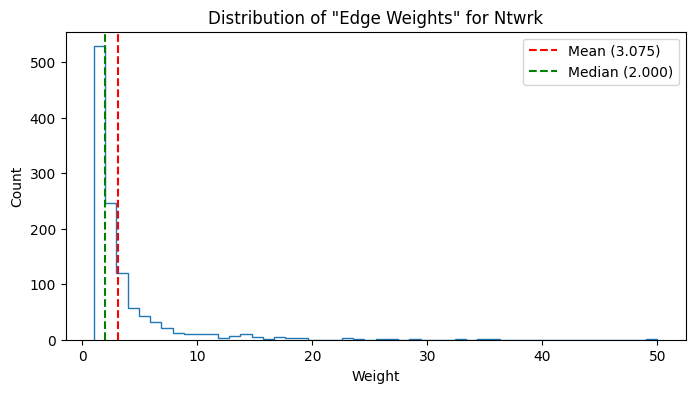

In [ ]:
_,ax = plt.subplots(figsize=(8,4))
custom_histogram(weights,50,ax,'Weight','Count','Distribution of "Edge Weights" for Ntwrk')

It seems that many edges have low weight (median value is 2), and we have few edges with weights up to the max value of 50. Let's remember (from Section 3.3) that this maximum number of messages are sent
> from Employee id. #605 (Admin) to Employee id. #704 (Operations)

We can actually confirm/calculate the summary statistics for "edge weights" from the **Count** column of **df_pairs_cnts** table (See Section 3.3.1) as follows:

In [ ]:
df_pairs_cnts.Count.agg(['min','median','mean','max','sum']).reset_index().T.rename(index={'index':'Statistics','Count':'Value'},columns=dict(zip(range(5),['']*5)))

,,,,,
Statistics,min,median,mean,max,sum
Value,1.0,2.0,3.075372,50.0,3509.0


We note that the sum of "edge weights" in Ntwrk (DiGraph) is 3509, which is the number of edges in our initial_Ntwrk (MultiDiGraph). Let us also add **department** information as **dept** metadata to each node of **Ntwrk** and make some more sanity checks for fun 😊:

In [ ]:
for u,v in Ntwrk.nodes(data=True):
  v['dept'] = df_employees2.loc[u,'department']
dept_names = dept_cnts.index.to_list()
N_dept = len(dept_names)
nodes_by_dept = []
for name in dept_names:
  nodes_by_dept.append([u for u,v in Ntwrk.nodes(data=True) if v['dept']==name])
node_cnt, edge_cnt, link_cnt = len(Ntwrk), len(Ntwrk.edges), len(df_merged.value_counts(['sender','receiver']))
print(f'Sanity check #1: Number of elements in employee dataframe ({N_all}) = Number of nodes in Ntwrk ({node_cnt})')
print(f'Sanity check #2: Number of unique links in df_merged table ({link_cnt}) = Number of edges in Ntwrk ({edge_cnt})')
print(f'Sanity check #3: There are {nx.number_of_selfloops(Ntwrk)} self-loops in Ntwrk')

Sanity check #1: Number of elements in employee dataframe (664) = Number of nodes in Ntwrk (664)
Sanity check #2: Number of unique links in df_merged table (1141) = Number of edges in Ntwrk (1141)
Sanity check #3: There are 0 self-loops in Ntwrk


#### 4.2.2 Degree distribution of **Ntwrk**
In undirected networks, "degree" of a node is just the number of connections or neighbors it has. However, in directed networks, due to directedness, we count incoming and outgoing connections separately and respectively obtain "in-degree and "out-degree" of a node. Similar to "edge weight" distribution, "node degree" distribution may be another important indicator for the global "connectedness" status of our network. Therefore, let's plot "degree distribution" (i.e. histogram of "node degrees") to gain further insight into our **Ntwrk** 😊. We'll make separate histograms for all 3 different degree types since **Ntwrk** is directed:

Is the sum of "in_degree" and "out_degree" equal to the total "degree" in directed Ntwrk? True



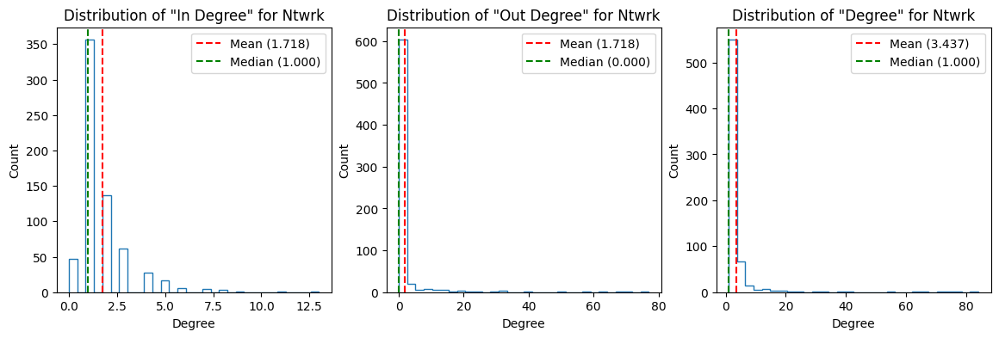

In [ ]:
degree_in = np.array(Ntwrk.in_degree)[:,1].reshape(-1,1) # Degree in
degree_out = np.array(Ntwrk.out_degree)[:,1].reshape(-1,1) # Degree out
degree_total = np.array(Ntwrk.degree)[:,1].reshape(-1,1) # Degree total
# Note that "total degree" is obtained via Ntwrk.degree, i.e. there is no function/method called "total_degree" for Ntwrk 😊
# Sanity check
print(f'Is the sum of "in_degree" and "out_degree" equal to the total "degree" in directed Ntwrk? {np.array_equal(degree_in+degree_out,degree_total)}\n')
_, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(14,4))
custom_histogram(degree_in,30,ax1,'Degree','Count','Distribution of "In Degree" for Ntwrk')
custom_histogram(degree_out,30,ax2,'Degree','Count','Distribution of "Out Degree" for Ntwrk')
custom_histogram(degree_total,30,ax3,'Degree','Count','Distribution of "Degree" for Ntwrk')

We observe that the distribution of "node degrees" in our **Ntwrk** follows what is known as "power-law distribution." This type of degree distribution is very typical for social networks. Actually, many naturally occurring system or network, from brain networks to power grids, not only "social networks" (like the one we are trying to analyze now 😊) tend to follow this interesting distribution in terms of "connection pattern" among its nodes. We can simply interpret this pattern as follows:
- we have a lot of people who have a relatively low degree and then
- as the degree gets higher we get a quick drop-off and a long tail corresponding to a few (important) people with really high degrees

We can also see summary statistics for different types of "node degree" in our Ntwrk as follows:

In [ ]:
df_degrees = pd.DataFrame(np.hstack((degree_in,degree_out,degree_total)),columns=['Degree_In','Degree_Out','Degree_Total'])
df_degrees.agg(['min','median','mean','max','count','sum']).applymap("{0:.2f}".format)

,Degree_In,Degree_Out,Degree_Total
min,0.00,0.00,1.00
median,1.00,0.00,1.00
mean,1.72,1.72,3.44
max,13.00,77.00,84.00
count,664.00,664.00,664.00
sum,1141.00,1141.00,2282.00


Suppose we didn't have **nx**, then we could have also calculated above summary statistics table from **df_pairs_cnts** as follows 😊:

In [ ]:
degree_in2 = df_pairs_cnts.value_counts('Receiver'); degree_out2 = df_pairs_cnts.value_counts('Sender')
degree_total2 = degree_in2.reindex(df_employees.id,fill_value=0)+degree_out2.reindex(df_employees.id,fill_value=0)
col_names_dict = dict(zip(range(3),df_degrees.columns+'_2'))
pd.concat([degree_in2,degree_out2,degree_total2],axis=1).fillna(0).agg(['min','median','mean','max','count','sum']).rename(columns=col_names_dict).applymap("{0:.2f}".format)

,Degree_In_2,Degree_Out_2,Degree_Total_2
min,0.00,0.00,1.00
median,1.00,0.00,1.00
mean,1.72,1.72,3.44
max,13.00,77.00,84.00
count,664.00,664.00,664.00
sum,1141.00,1141.00,2282.00


Notice that, on average, the nodes in our directed **Ntwrk** have about 1.72 😊 connections or neighbors. A "fractional neighbor" sounds quite odd and scary! 😊 But, it is just an average, of course each node has a "whole number" of good and healthy neighbors. 😊 As a bonus observation, we also note that the mean of "In Degree" and "Out Degree" are the same, can you tell why? 😊 Let me try: Because, a connection or edge that is "pointing to" or "going into" a node must be "coming out" of another node in the network. The phrases "going into a node" and "coming out of a node" respectively refer to 1 point increase in the overall or total "In Degree" and "Out Degree" counts in the network. As we see from the correlations in the following display/table, "In Degree" and " Out Degree" are weakly correlated (with a Pearson correlation coefficient of about only 0.1), yet amazingly 😊 their "means" are the same!

Here are the correlations among different degree measures for our directed **Ntwrk**:

In [ ]:
df_degrees.corr().applymap("{0:.2f}".format)

,Degree_In,Degree_Out,Degree_Total
Degree_In,1.00,0.10,0.28
Degree_Out,0.10,1.00,0.98
Degree_Total,0.28,0.98,1.00


Let us also investigate the relationship between "number of neighbors" and different "degree" metrics for both our original directed **Ntwrk** and its "undirected" version, namely **Ntwrk_undirected** obtained via **Ntwrk.to_undirected()**. In **Ntwrk_undirected** two nodes are assumed "connected" if there is any sending or receiving relationship between them. That is, two nodes **u** and **v** are counted as connected if either or both of **(u, v)** or **(v, u)** are in (sender, receiver) pairs in the message data.

Ntwrk is a DiGraph with 664 nodes and 1141 edges
Ntwrk_undirected is a Graph with 664 nodes and 1114 edges 



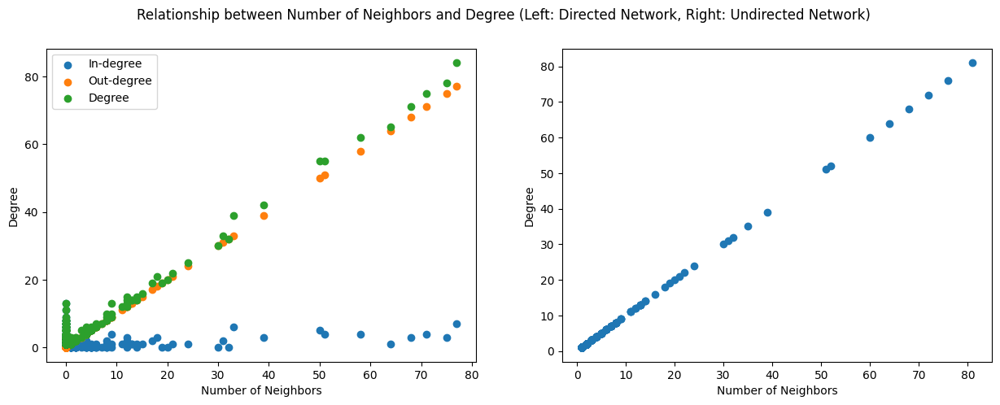

In [ ]:
Ntwrk_undirected = Ntwrk.to_undirected() # Ntwrk_undirected is the undirected version of our Ntwrk 😊
print('Ntwrk is a',nx.info(Ntwrk))
print('Ntwrk_undirected is a',nx.info(Ntwrk_undirected),'\n')
num_neighbors = [len(Ntwrk[u]) for u in Ntwrk]
_, (ax1,ax2) = plt.subplots(1,2,figsize=(15,5))
ax1.scatter(num_neighbors,degree_in,label='In-degree')
ax1.scatter(num_neighbors,degree_out,label='Out-degree')
ax1.scatter(num_neighbors,degree_total,label='Degree')
ax1.legend(); ax1.set_xlabel('Number of Neighbors'); ax1.set_ylabel('Degree')
ax2.scatter([len(Ntwrk_undirected[u]) for u in Ntwrk_undirected],[v for u,v in Ntwrk_undirected.degree()])
ax2.set_xlabel('Number of Neighbors'); ax2.set_ylabel('Degree')
plt.suptitle('Relationship between Number of Neighbors and Degree (Left: Directed Network, Right: Undirected Network)')
plt.show()

We observe that:
- for directed networks (see the left-panel of the figure above),
-- there are 3 types of degrees, namely "in-degree," "out-degree," and total "degree," which is the sum of in- and out-degrees, and
-- "out degree" is equal to "number of neighbors"
- whereas, for undirected networks (see the right-panel of the figure above),
-- there is only one type of "degree" and it is equal to the "number of neighbors"

We'll talk more about "degree" and other measures of node importance in Section 4.8.
#### 4.2.3 Density analysis of **Ntwrk**
Let's also check another global health status indicator for our network, namely the **density**, which indicates how "dense" is the network. 😊 In a "self-loop-less" 😊 directed graph/network with $n$ nodes, we can have at most $n(n-1)$ edges (i.e. ordered pair of nodes), if we normalize the edge count in a network with this maximum possible edge count, voila! we get the network **density**. Let's compute it manually and then compare with the output of **nx.density(Ntwrk)**:

In [ ]:
print(edge_cnt/(node_cnt*(node_cnt-1)),'=',nx.density(Ntwrk),f'-> {nx.density(Ntwrk):.2%}')

0.0025918152246997036 = 0.0025918152246997036 -> 0.26%


Yep! Our brain is working just fine! 😊 Aaaand, it is not difficult to see that a fully connected network (aka complete graph), where there is an edge between each ordered pair of nodes, will have the maximum density of score 1. It seem that our network is using only about 0.26% of its full "networking" capacity, so, there is a "huge space for improvement!" That we can tell from the very beginning. 😊

Let's also check **density** of the "undirected version of **Ntwrk**," namely **Ntwrk_undirected**:

In [ ]:
print(nx.density(Ntwrk_undirected),f'-> {nx.density(Ntwrk_undirected):.2%}')

0.0050609678533137074 -> 0.51%


We observe that **Ntwrk_undirected** is using about 0.51% of its full "networking" capacity, which is almost the double of the density **Ntwrk**. Why is this so? Because, while converting our "directed" type **Ntwrk** into "undirected" type, *reciprocal* argument of the **nx.to_undirected()** utility was "False," which is the default value. This means that nodes **a** and **b** in **Ntwrk_undirected** are considered as "connected," if **Ntwrk** has any of ordered pairs **(a, b)** or **(b, a)** as its edges. Which in turn implies that the number of edges in the undirected version of the network will be less than or equal to the number of edges in the original directed network. For instance, edges **(a, b)** and **(b, a)** will be counted as two different edges in the directed network, because order, i.e. (sender, receiver) pairing is important. However, same edge couple will be as counted as one single edge in the undirected network.

While calculating the density, another issue we encounter is the **normalization factor**, i.e. the number of all possible connections or edges, which will be different for directed and undirected versions of the network. From the discussion above, we recall that for the directed case, $n$ being the number of nodes, "normalization factor" is $n(n-1)$. Whereas, for the undirected case, it is just half of this value, i.e. $n(n-1)/2$, because while forming the edges, ordering is **not important**, i.e. node pairs**(a, b)** and **(b, a)** refer to the same edge, in this (undirected) case.

In [ ]:
edge_cnt_undirected = len(Ntwrk_undirected.edges)
print(f'There are {edge_cnt} and {edge_cnt_undirected} edges in the directed and undirected networks, respectively.')
print(f'The difference of {edge_cnt-edge_cnt_undirected} in edge counts is due to both-way connected nodes in the directed network.')

There are 1141 and 1114 edges in the directed and undirected networks, respectively.
The difference of 27 in edge counts is due to both-way connected nodes in the directed network.


Let's compute the density for the undirected network manually and then compare it with the output of **nx.density(Ntwrk_undirected)**:

In [ ]:
edge_cnt_undirected/(node_cnt*(node_cnt-1)/2),nx.density(Ntwrk_undirected)

(0.0050609678533137074, 0.0050609678533137074)

Gooooood! We are a happy (data) camper again! 😊
### 4.3 Connected components analysis of **Ntwrk**
Here, we would like find out whether all the nodes are "connected" (i.e. somehow reachable from other nodes) in our network. Let’s ask **nx** and see 😊:

In [ ]:
try:
  print(f'Dear nx, please tell me if our Ntwrk is connected: {nx.is_connected(Ntwrk)}')
  nx.is_connected(Ntwrk)
except Exception as e:
  print(e)

not implemented for directed type


We have been very kind yet **nx** "abstained" 😊 from giving us an answer. However, from its response we suspect that there could be an answer for the undirected type. Let's try asking the same question for the undirected version of Ntwrk, namely **Ntwrk_undirected**:

In [ ]:
print(f'Dear nx, please tell me if (undirected version of) our network is connected: {nx.is_connected(Ntwrk_undirected)}')

Dear nx, please tell me if (undirected version of) our network is connected: False


Aha! It seems that not all the nodes are connected in our (undirected version of) network. No worries, it could happen to any network, this is life and there'll always be outliers, out-liars, out-siders, out-sleepers, etc. 😊. Let us find out what is what in terms of "connectedness" in our network, by searching for connected set or group of nodes aka "connected components" and by looking into their properties, such as length (i.e. number of nodes), diameter (i.e. maximum distance among the nodes), and average shortest path length:

In [ ]:
conn_comps = list(nx.connected_components(Ntwrk_undirected))
cc_len_list = np.array([len(a_comp) for a_comp in conn_comps])
sort_idx = np.argsort(cc_len_list)[::-1]
for idx in sort_idx:
  a_comp = conn_comps[idx]
  Sub_Nt = Ntwrk_undirected.subgraph(a_comp)
  print(f'Conn. comp. with -> Length: {cc_len_list[idx]:3}, Diameter: {nx.diameter(Sub_Nt):2}, Avg. Shortest path length: {nx.average_shortest_path_length(Sub_Nt):.2}, Node id. #s: {*list(a_comp)[:10],}')
print('Note: For connected components with more than 10 nodes, only first 10 are displayed')
L = len(Ntwrk_undirected) # Sanity check on sum of lengths of connected components
print(f'\nIs the length of whole network ({L}) equal to the sum of lengths of connected components? {L==sum(cc_len_list)}')

Conn. comp. with -> Length: 650, Diameter: 12, Avg. Shortest path length: 3.9, Node id. #s: (3, 6, 8, 9, 12, 19, 23, 26, 27, 29)
Conn. comp. with -> Length:   3, Diameter:  2, Avg. Shortest path length: 1.3, Node id. #s: (808, 1596, 1607)
Conn. comp. with -> Length:   3, Diameter:  2, Avg. Shortest path length: 1.3, Node id. #s: (1496, 824, 762)
Conn. comp. with -> Length:   2, Diameter:  1, Avg. Shortest path length: 1.0, Node id. #s: (1669, 1670)
Conn. comp. with -> Length:   2, Diameter:  1, Avg. Shortest path length: 1.0, Node id. #s: (1568, 1569)
Conn. comp. with -> Length:   2, Diameter:  1, Avg. Shortest path length: 1.0, Node id. #s: (280, 321)
Conn. comp. with -> Length:   2, Diameter:  1, Avg. Shortest path length: 1.0, Node id. #s: (521, 305)
Note: For connected components with more than 10 nodes, only first 10 are displayed

Is the length of whole network (664) equal to the sum of lengths of connected components? True


It seems that we have one large "connected component" subgraph or subnetwork with 650 nodes and 6 other (small) subnetworks, 2 with 3 nodes, and 4 with 2 nodes. Let's also see "department" info for these 6 small groups of nodes (i.e. "connected components"), which kinda 😊 form little islands among themselves, isolated from the rest of the big network, for fun 😊:

In [ ]:
for idx in sort_idx[1:]:
  a_comp = conn_comps[idx]
  node_dept_list = [(a_node,df_employees2.loc[a_node,'department']) for a_node in a_comp]
  print(f'Conn. comp. with -> Length: {cc_len_list[idx]}, Node id. #s and their Dept. names: {node_dept_list}')

Conn. comp. with -> Length: 3, Node id. #s and their Dept. names: [(808, 'Operations'), (1596, 'IT'), (1607, 'Admin')]
Conn. comp. with -> Length: 3, Node id. #s and their Dept. names: [(1496, 'Sales'), (824, 'Marketing'), (762, 'Engineering')]
Conn. comp. with -> Length: 2, Node id. #s and their Dept. names: [(1669, 'Sales'), (1670, 'Admin')]
Conn. comp. with -> Length: 2, Node id. #s and their Dept. names: [(1568, 'Marketing'), (1569, 'Admin')]
Conn. comp. with -> Length: 2, Node id. #s and their Dept. names: [(280, 'Admin'), (321, 'Admin')]
Conn. comp. with -> Length: 2, Node id. #s and their Dept. names: [(521, 'Operations'), (305, 'Operations')]


Later, in Section 4.7, we'll draw a subgraph of Ntwrk, consisting of these 2x3 + 4x2 = 14 people or nodes (that we named as **low_comm_nodes**) and confirm their somewhat "isolated" or "less communicating" (to be politically correct 😊) situation in the network.

In [ ]:
low_comm_nodes = set()
for idx in sort_idx[1:]:
  low_comm_nodes = low_comm_nodes.union(conn_comps[idx])
print(f'There are {len(low_comm_nodes)} people with relatively low communication activity, whose id. #s are:\n{*sorted(low_comm_nodes),}')

There are 14 people with relatively low communication activity, whose id. #s are:
(280, 305, 321, 521, 762, 808, 824, 1496, 1568, 1569, 1596, 1607, 1669, 1670)


We already saw/realized that we couldn't do "connected components" for a directed network. However, there are still connectedness analysis methods for directed graphs. Actually, we have just figured out one them, namely "weakly connected components" (WCC). A directed network is "weakly connected" if there is a path between every two nodes in the underlying undirected version of the network. In WCC analysis, we look for "weakly connected" sub-networks (or components) in the undirected version of the network, which is equivalent to what we just did above. The other type of connectedness analysis, namely "strongly connected components" (SCC), is more interesting and maybe more suited for directed networks. A directed graph is "strongly connected" if each node in the network is reachable from other nodes and in SCC analysis, we look for "strongly connected" sub-networks in the directed network. (And by definition, a "strongly connected" directed network is also "weakly connected." 😊)

Let's also carry out WCC and SCC analyses for **Ntwrk**, for the sake of completeness 😊:

In [ ]:
conn_comps = list(nx.weakly_connected_components(Ntwrk))
cc_len_list = np.array([len(a_comp) for a_comp in conn_comps])
sort_idx = np.argsort(cc_len_list)[::-1]
for idx in sort_idx:
  a_comp = conn_comps[idx]
  Sub_Nt = Ntwrk.subgraph(a_comp)
  print(f'Weakly conn. comp. with -> Length: {cc_len_list[idx]:3}, Node id. #s: {*list(a_comp)[:10],}')
print('Note: For connected components with more than 10 nodes, only first 10 are displayed')
L = len(Ntwrk) # Sanity check on sum of lengths of connected components
print(f'\nIs the length of whole network ({L}) equal to the sum of lengths of connected components? {L==sum(cc_len_list)}')

Weakly conn. comp. with -> Length: 650, Node id. #s: (3, 6, 8, 9, 12, 19, 23, 26, 27, 29)
Weakly conn. comp. with -> Length:   3, Node id. #s: (808, 1596, 1607)
Weakly conn. comp. with -> Length:   3, Node id. #s: (1496, 824, 762)
Weakly conn. comp. with -> Length:   2, Node id. #s: (1669, 1670)
Weakly conn. comp. with -> Length:   2, Node id. #s: (1568, 1569)
Weakly conn. comp. with -> Length:   2, Node id. #s: (280, 321)
Weakly conn. comp. with -> Length:   2, Node id. #s: (521, 305)
Note: For connected components with more than 10 nodes, only first 10 are displayed

Is the length of whole network (664) equal to the sum of lengths of connected components? True


In [ ]:
conn_comps = [a_comp for a_comp in list(nx.strongly_connected_components(Ntwrk)) if len(a_comp)>1]
cc_len_list = np.array([len(a_comp) for a_comp in conn_comps])
sort_idx = np.argsort(cc_len_list)[::-1]
for idx in sort_idx:
  a_comp = conn_comps[idx]
  Sub_Nt = Ntwrk.subgraph(a_comp)
  print(f'Strongly conn. comp. with -> Length: {cc_len_list[idx]:2}, Node id. #s: {*list(a_comp),}')

Strongly conn. comp. with -> Length: 24, Node id. #s: (128, 1665, 386, 260, 1028, 389, 144, 1171, 408, 290, 422, 317, 1097, 586, 79, 337, 469, 598, 1500, 605, 221, 734, 1510, 509)
Strongly conn. comp. with -> Length:  3, Node id. #s: (1393, 332, 908)
Strongly conn. comp. with -> Length:  2, Node id. #s: (752, 1142)
Strongly conn. comp. with -> Length:  2, Node id. #s: (1299, 1646)


Let's check whether the largest SCC is a subset of **both_way_comm** (i.e. set of both-way communicating employees) that we have found earlier (in Section 3.4).

In [ ]:
largest_SCC = conn_comps[sort_idx[0]]
print(f'Is the largest SCC is a subset of both_way_comm? {largest_SCC.issubset(both_way_comm)}')

Is the largest SCC is a subset of both_way_comm? True


#### 4.3.1 Transitivity and reciprocity analysis of **Ntwrk**
"Transitivity" or "clustering coefficient" is a related network metric that quantifies overall tendency of nodes to form clusters (i.e. densely connected groups of nodes). For instance, if (u, v) and (v, z) are edges in a directed network, and if there is a "transitive" relationship among these particular 3 nodes, then (u, z) must also be an edge in the network. In simple terms, if **u** is friends with **v** and **v** is friends with **z**, "transitivity" measure of the network strives to quantify the chances that **u** is also friends with **z**. Therefore, we compute transitivity as the ratio of number of actual "triangles" to number of potential triangles or "triads" (two edges with a shared node but not an actual or full triangle, i.e. one edge is missing 😊).

Let's now compute transitivity for directed **Ntwrk** and undirected **Ntwrk_ undirected**:

In [ ]:
nx.transitivity(Ntwrk),nx.transitivity(Ntwrk_undirected)

(0.004589695096637298, 0.016517724789293125)

Again, these (we guess 😊) are relatively low values, which indicate that neither our network nor its undirected version is very transitive..

"Reciprocity" on the other, is defined only for directed graphs as the ratio of number of edges pointing in both directions (we called these as "both-way" connections) to the total number of edges in the graph. As we've underlined several times (see for instance, Sections 3.4 and 3.5) we have 27 pairs or edges in Ntwrk that communicate both-ways. This corresponds to a "both-way" edge count of 27x2=54, we can then calculate reciprocity of Ntwrk manually and compare with the result of nx.reciprocity(Ntwrk) as follows:

In [ ]:
print(nx.reciprocity(Ntwrk),'=',(27*2)/edge_cnt,f'-> {nx.reciprocity(Ntwrk):.2%}')

0.04732690622261174 = 0.04732690622261174 -> 4.73%


This figure/number indicates that only about 4.7% of edges or connections in **Ntwrk** are "both-ways."
### 4.4 Draw/visualize whole network
So much for "getting to know" our network, now is the really fun part, which involves all kinds of drawing and coloring using crayons 😊, starts! Let's first create a custom colormap to draw nodes belonging to different departments with different colors and also adjust node positions using different methods, namely [spring layout](https://networkx.org/documentation/stable/reference/generated/networkx.drawing.layout.spring_layout.html), [circular layout]( https://networkx.org/documentation/stable/reference/generated/networkx.drawing.layout.circular_layout.html), and two bonus "magic" custom node positioning method that we've developed for this amazing study 😊:

In [ ]:
custom_cmap = ['r','g','b','y','m','c'] # Custom colors for different depts.
ordered_node_list = [u for a_dept in nodes_by_dept for u in a_dept]
color_list = []
for u,v in Ntwrk.nodes(data=True):
  idx = dept_names.index(v['dept'])
  u_color = custom_cmap[idx]
  color_list.append(u_color) # Color assignment to each node depending on its dept.
  v['color'] = u_color
pos_spring = nx.spring_layout(Ntwrk) # Spring layout for whole network
pos_circular = nx.circular_layout(Ntwrk) # Circular layout for whole network
# Custom node positions #1 (Nodes grouped by dept. are placed linearly at separate locations):
y = np.linspace(0,10,node_cnt).astype(np.float32)
pos_linear_not_shifted = dict(zip(ordered_node_list,np.column_stack([np.zeros((node_cnt,1)),y])))
custom_pos_linear,x_shift,y_shift = {},[0,1,2,3,-1,-2],np.array([0,1,-1,0,1,-1])*10
for idx in range(N_dept):
  sub_dict = {k:pos_linear_not_shifted[k] for k in nodes_by_dept[idx]}
  custom_pos_linear.update({u:[v[0]+x_shift[idx],v[1]+y_shift[idx]] for u,v in sub_dict.items()})
# Custom node positions #2 (Nodes grouped by dept. are placed ellipsoidally at separate locations):
custom_pos_ellipsoid = dict.fromkeys(ordered_node_list)
for idx in range(N_dept):
  theta = (np.linspace(0,1,dept_cnts[idx]+1)[:-1]*2*np.pi).astype(np.float32)
  custom_pos_ellipsoid.update(dict(zip(nodes_by_dept[idx],np.column_stack([.1*np.cos(theta)+x_shift[idx],np.sin(theta)+y_shift[idx]]))))

In [ ]:
# For annotation (make empty plot with correct color and label for each group)
def add_custom_legend():
  for idx in range(N_dept): plt.scatter([],[],c=custom_cmap[idx],label=dept_names[idx])

We suspect that a “relatively sized” graph with 664 nodes (corresponding to 664 employees) will most probably lead to messy or cluttered plot. 😊 But still, we want to try drawing the whole network, out of data-scientific curiosity 😊:

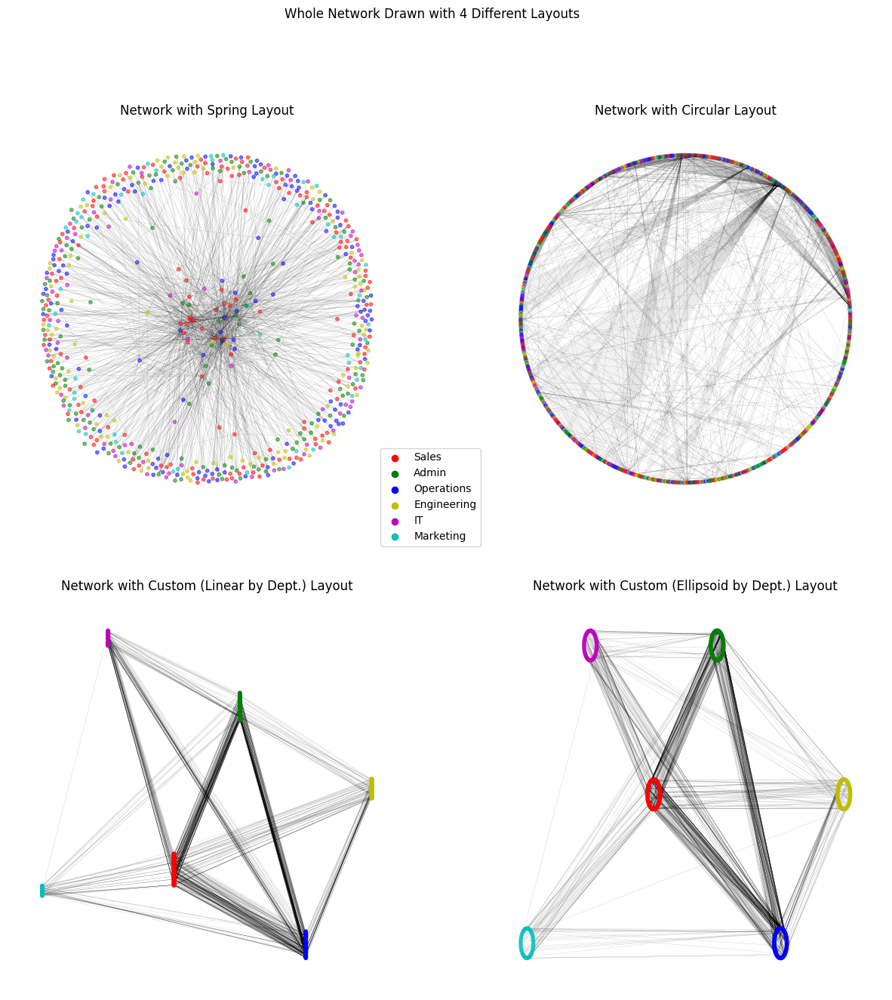

In [ ]:
_,((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2,figsize=(15,15))
options = {'node_size':10,'with_labels':False,'node_color':color_list,'alpha':.5,'arrowstyle':'-','width':.1}
nx.draw_networkx(Ntwrk,pos=pos_spring,ax=ax1,**options)
ax1.set_title('Network with Spring Layout'); ax1.set_axis_off()
nx.draw_networkx(Ntwrk,pos=pos_circular,ax=ax2,**options)
ax2.set_title('Network with Circular Layout'); ax2.set_axis_off()
nx.draw_networkx(Ntwrk,pos=custom_pos_linear,ax=ax3,**options)
ax3.set_title('Network with Custom (Linear by Dept.) Layout'); ax3.set_axis_off()
nx.draw_networkx(Ntwrk,pos=custom_pos_ellipsoid,ax=ax4,**options)
ax4.set_title('Network with Custom (Ellipsoid by Dept.) Layout'); ax4.set_axis_off()
add_custom_legend(); ax4.legend(loc='right',bbox_to_anchor=(0,1.25)); plt.suptitle('Whole Network Drawn with 4 Different Layouts'); plt.show()

The graph on the **upper left** panel is an example of what network scientists justly call a "hairball" 😊, which is neither "good-looking" nor informative. There are way too many items (664 nodes and 1141 edges) in the drawing. As such, our view is blocked and it is very difficult, if not impossible, to find our way in the graph. Therefore, if we insist on plotting all of these items at once, we need to be "extra smart" 😊 to avoid clutter as much as possible and produce sensible or informative visuals.

The plot or graph on the **upper right** panel, on the hand raises our hopes for future 😊, indicating that "circular layout" may be a better option for viewing our network activity. We can readily see that some nodes are emitting or receiving many rays (i.e. edges or links 😊) compared to the rest. These must the some important people in some sense, but in what sense, that’s something we need to figure out.. 😊

As for the graph in the **lower left** panel, we spent considerable time 😊 to come up with this visually pleasing and relatively informative visual. The key idea here is to pay attention "node placement" so that a less-cluttered view can be obtained. As noted, to have a better view of **inter-departmental** communication, as we placed nodes belonging to different departments linearly at different locations. This way, **intra-departmental** edges became invisible like magic! 😊 We hope you'll like/enjoy it.. 😊

Finally, in the graph of **lower right** panel, **inter-departmental** communication activity is emphasized again, however this time we also have a "glimpse of" **intra-departmental** communication activity as well. Therefore this is a viewing approach that we can use when we need a more balanced view of both (i.e. within- and among-departments) types of communication.

Without further due, let's do some more coloring exercises.. 😊

#### 4.4.1 Graph of whole network (in circular layout) with default node ordering (left) and nodes ordered by department (right)

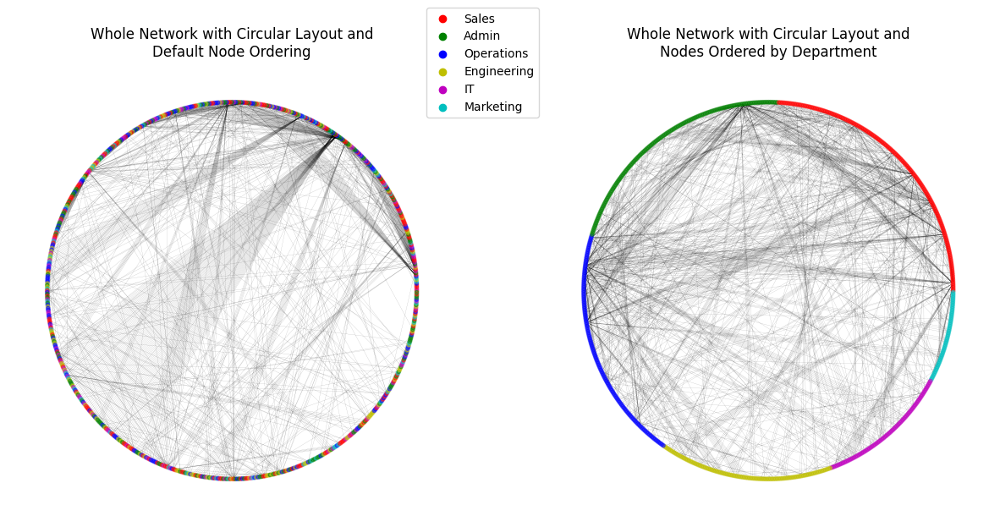

In [ ]:
_,(ax1,ax2) = plt.subplots(1,2,figsize=(15,7))
nx.draw_networkx(Ntwrk,pos=pos_circular,ax=ax1,**options)
ax1.set_title('Whole Network with Circular Layout and\nDefault Node Ordering'); ax1.set_axis_off()
# Let us order the nodes by department using some python magic :)
ordered_node_list = [u for a_dept in nodes_by_dept for u in a_dept]
theta = (np.linspace(0,1,len(Ntwrk)+1)[:-1]*2*np.pi).astype(np.float32)
pos_circular_ordered = dict(zip(ordered_node_list,np.column_stack([np.cos(theta),np.sin(theta)])))
nx.draw_networkx(Ntwrk,pos=pos_circular_ordered,ax=ax2,**options)
ax2.set_title('Whole Network with Circular Layout and\nNodes Ordered by Department'); ax2.set_axis_off()
add_custom_legend(); ax2.legend(loc='right',bbox_to_anchor=(0,1)); plt.show()

Both visuals look very pleasing and informative, yet each has its pros and cons, as usual 😊. In default node ordering (left panel), some communication patterns at the individual or node level is more visible, whereas, when nodes are ordered by department (right panel) we can better observe communication patterns at the departmental level.

We can further dig into these two different views or perspectives on the same message data and try to understand why they look different. While a network is constructed from its edges, **nx** collects the nodes (at both ends of edges) as they are encountered in edge list. Therefore, as we have initiated our network from ordered or sorted edges (i.e. list of sender-receiver pairs) in **df_merged** table, our network **Ntwrk** has an advantageous natural node ordering. In this default node ordering, a group of nodes receiving edges or links from a particular node are encountered and hence added to the network one after other in other. For instance, assume that a source node **s** is already in the network and we encounter pairs (s, u), (s, v), and (s, z) in the table (with this order), then nodes **u**, **v**, and **z** will be added to the network in this order. Therefore, **u**, **v**, and **z** will be positioned in the graph one after other in this same other and when we draw the network, the edges (s, u), (s, u), and (s, v) will nicely look like as rays emitted from node **s** and going into the three neighbor nodes **u**, **v**, and **z**.
#### 4.4.2 Visualize adjacency matrix using a heatmap

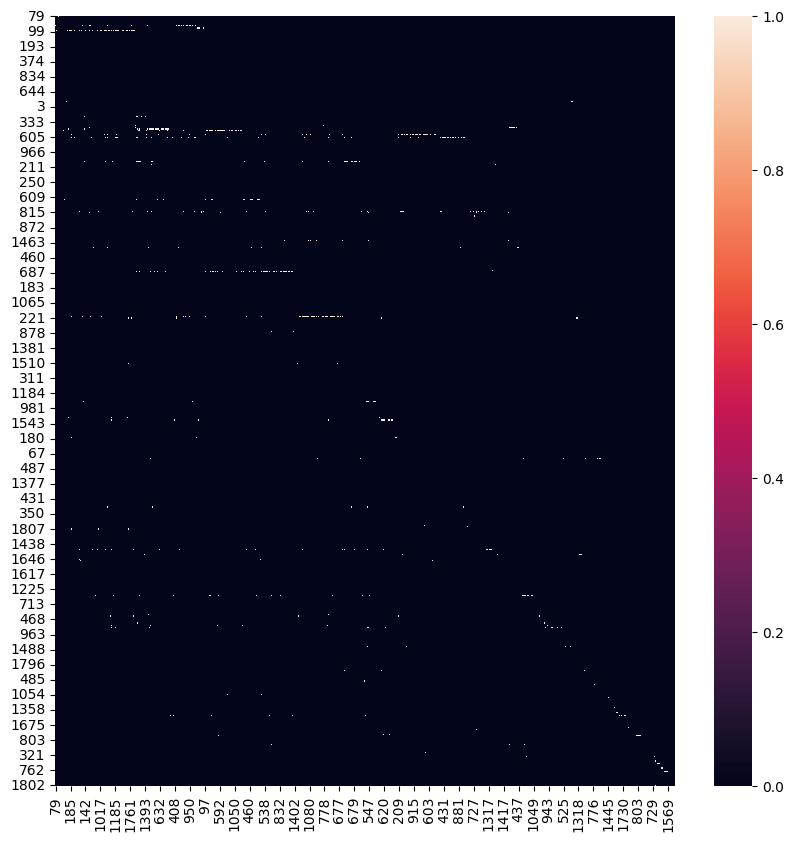

In [ ]:
plt.figure(figsize=(10,10))
tick_labels = np.array([str(u) for u,_ in Ntwrk.nodes(data=True)])
A = nx.adjacency_matrix(Ntwrk); ax = sns.heatmap(A.todense()>1)
new_tick_labels = tick_labels[(ax.get_xticks()-.5).astype(int)]; ax.set_xticklabels(new_tick_labels)
new_tick_labels = tick_labels[(ax.get_yticks()-.5).astype(int)]; ax.set_yticklabels(new_tick_labels); plt.show()

Here rows and columns respectively correspond to sender and receiver nodes (and nodes correspond to employee id. #s). We observe some streaks along the rows, which indicate that a sending node have sent messages to many different receiver nosted listed along the columns. And "luckily" those receivers ordered along the column direction to be next to each other. 😊 Actually this is not due to "luck," as we explained in Section 4.4.1, we defined our network from the ordered or sorted edges (i.e. list of sender-receiver pairs) in **df_merged** table, which gave rise to an advantageous natural node ordering in **Ntwrk** and consequently in adjacency matrix **A**.
### 4.5 Make subgraph of "good communicators" and "largest strongly connected component"
By using sub-graph feature of **nx**, we can subset the network **Ntwrk** just to include nodes in the "common_idxs" and "largest strongly connected component" sets. Earlier, in Section 3.4, we named those nodes (employees) as "good communicators" 😊. Let us remember who these were and draw our sub-plot 😊, pardon sub-graph:

In [ ]:
print(f'{len(common_idxs)} nodes in the "good communicators" group are:\n{*sorted(common_idxs),}\n')
print(f'{len(both_way_comm)} nodes in the "both-way communicating" group are:\n{*sorted(both_way_comm),}\n')
print(f'{len(largest_SCC)} nodes in the "largest strongly connected" group are:\n{*sorted(largest_SCC),}\n')
diff_set1 = common_idxs-both_way_comm
print(f'Difference (with {len(diff_set1)} elements) of "common_idxs" from "both_way_comm" set is: {*sorted(diff_set1),}\n')
diff_set2 = both_way_comm-largest_SCC
print(f'Difference (with {len(diff_set2)} elements) of "both_way_comm" from "largest strongly connected" set is: {*sorted(diff_set2),}')

38 nodes in the "good communicators" group are:
(79, 128, 144, 221, 247, 260, 290, 317, 332, 337, 370, 386, 389, 408, 422, 469, 509, 586, 598, 605, 698, 734, 752, 815, 908, 1021, 1028, 1080, 1097, 1142, 1171, 1299, 1317, 1393, 1500, 1510, 1646, 1665)

31 nodes in the "both-way communicating" group are:
(79, 128, 144, 221, 260, 290, 317, 332, 337, 386, 389, 408, 422, 469, 509, 586, 598, 605, 734, 752, 908, 1028, 1097, 1142, 1171, 1299, 1393, 1500, 1510, 1646, 1665)

24 nodes in the "largest strongly connected" group are:
(79, 128, 144, 221, 260, 290, 317, 337, 386, 389, 408, 422, 469, 509, 586, 598, 605, 734, 1028, 1097, 1171, 1500, 1510, 1665)

Difference (with 7 elements) of "common_idxs" from "both_way_comm" set is: (247, 370, 698, 815, 1021, 1080, 1317)

Difference (with 7 elements) of "both_way_comm" from "largest strongly connected" set is: (332, 752, 908, 1142, 1299, 1393, 1646)


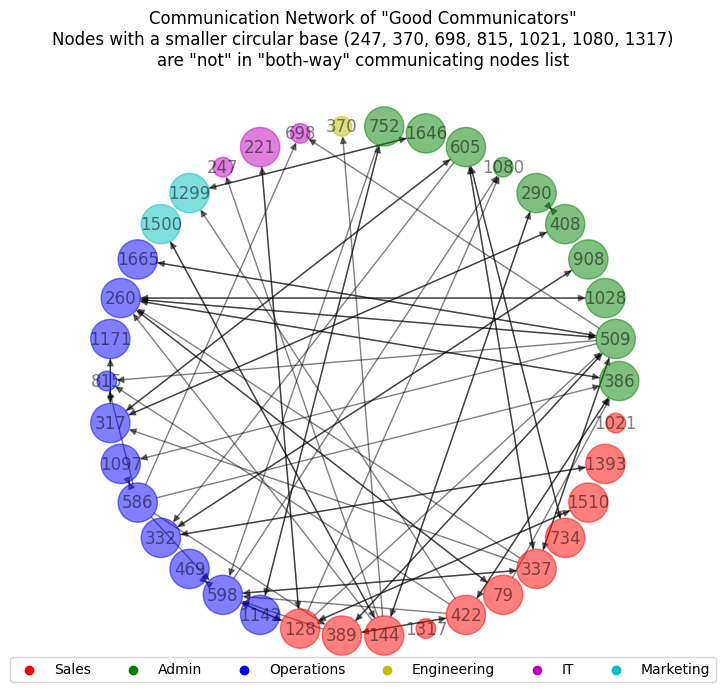

In [ ]:
Sub_Nt = Ntwrk.subgraph(common_idxs)
dept_ordered_nodes = sorted(Sub_Nt.nodes, key=lambda u: Sub_Nt.nodes[u]['dept'])
theta = (np.linspace(0,1,len(Sub_Nt)+1)[:-1]*2*np.pi).astype(np.float32)
pos_custom = dict(zip(dept_ordered_nodes,np.column_stack([np.cos(theta),np.sin(theta)])))
custom_colors = [v['color'] for _,v in Sub_Nt.nodes(data=True)]
custom_sizes = [200 if node in diff_set1 else 800 for node in Sub_Nt]
plt.figure(figsize=(8,8))
nx.draw_networkx(Sub_Nt,pos=pos_custom,node_size=custom_sizes,node_color=custom_colors,alpha=.5)
add_custom_legend(); plt.legend(loc='lower center',ncol=N_dept); plt.axis('off')
plt.title(f'Communication Network of "Good Communicators"\nNodes with a smaller circular base {*sorted(diff_set1),}\nare "not" in "both-way" communicating nodes list'); plt.show()

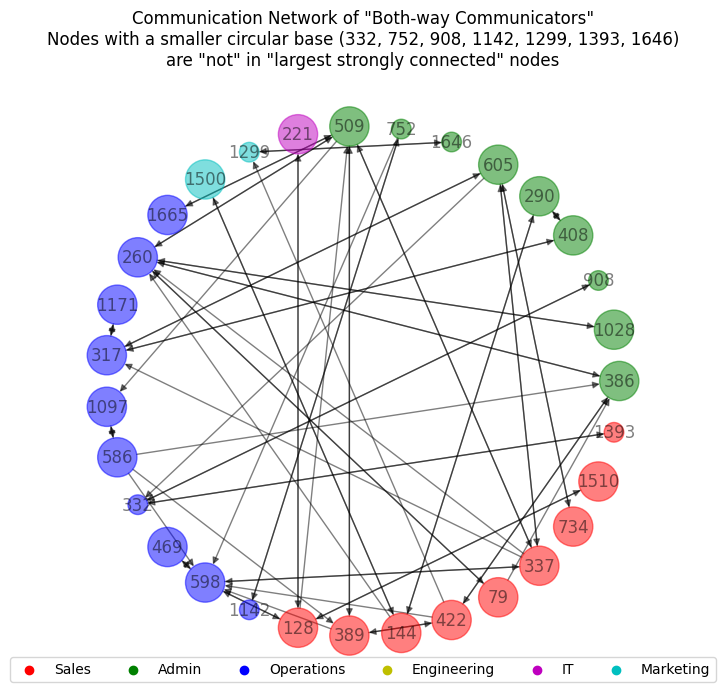

In [ ]:
Sub_Nt = Ntwrk.subgraph(both_way_comm)
dept_ordered_nodes = sorted(Sub_Nt.nodes, key=lambda u: Sub_Nt.nodes[u]['dept'])
theta = (np.linspace(0,1,len(Sub_Nt)+1)[:-1]*2*np.pi).astype(np.float32)
pos_custom = dict(zip(dept_ordered_nodes,np.column_stack([np.cos(theta),np.sin(theta)])))
custom_colors = [v['color'] for _,v in Sub_Nt.nodes(data=True)]
custom_sizes = [200 if node in diff_set2 else 800 for node in Sub_Nt]
plt.figure(figsize=(8,8))
nx.draw_networkx(Sub_Nt,pos=pos_custom,node_size=custom_sizes,node_color=custom_colors,alpha=.5)
add_custom_legend(); plt.legend(loc='lower center',ncol=N_dept); plt.axis('off')
plt.title(f'Communication Network of "Both-way Communicators"\nNodes with a smaller circular base {*sorted(diff_set2),}\nare "not" in "largest strongly connected" nodes'); plt.show()

### 4.6 Make subgraph of largest strongly connected component

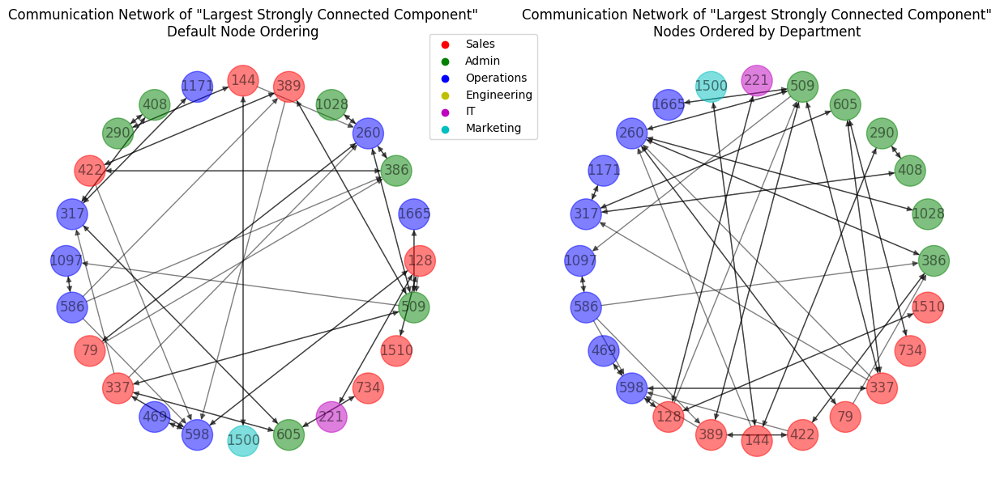

In [ ]:
Sub_Nt = Ntwrk.subgraph(largest_SCC)
dept_ordered_nodes = sorted(Sub_Nt.nodes, key=lambda u: Sub_Nt.nodes[u]['dept'])
theta = (np.linspace(0,1,len(Sub_Nt)+1)[:-1]*2*np.pi).astype(np.float32)
pos_custom = dict(zip(dept_ordered_nodes,np.column_stack([np.cos(theta),np.sin(theta)])))
custom_colors = [v['color'] for _,v in Sub_Nt.nodes(data=True)]
_,(ax1,ax2) = plt.subplots(1,2,figsize=(15,7))
nx.draw_networkx(Sub_Nt,pos=nx.circular_layout(Sub_Nt),node_size=750,node_color=custom_colors,alpha=.5,ax=ax1)
ax1.set_title('Communication Network of "Largest Strongly Connected Component"\nDefault Node Ordering'); ax1.set_axis_off()
nx.draw_networkx(Sub_Nt,pos=pos_custom,node_size=750,node_color=custom_colors,alpha=.5,ax=ax2)
ax2.set_title('Communication Network of "Largest Strongly Connected Component"\nNodes Ordered by Department'); ax2.set_axis_off()
add_custom_legend(); ax2.legend(loc='right',bbox_to_anchor=(0,.9)); plt.show()

Let's also overlay this on the big picture:

In [ ]:
def overlay_plot_maker(subnet_node_list,pos_dict,plt_title):
  plt.figure(figsize=(15,15))
  nx.draw_networkx(Ntwrk,pos=pos_dict,**options)
  Sub_Nt = Ntwrk.subgraph(subnet_node_list)
  dept_colors = [v['color'] for u,v in Sub_Nt.nodes(data=True)]
  nx.draw_networkx(Sub_Nt,pos=pos_dict,node_size=500,node_color=dept_colors,alpha=.5)
  add_custom_legend(); plt.legend(loc='upper left'); plt.axis('off'); plt.title(plt_title); plt.show()

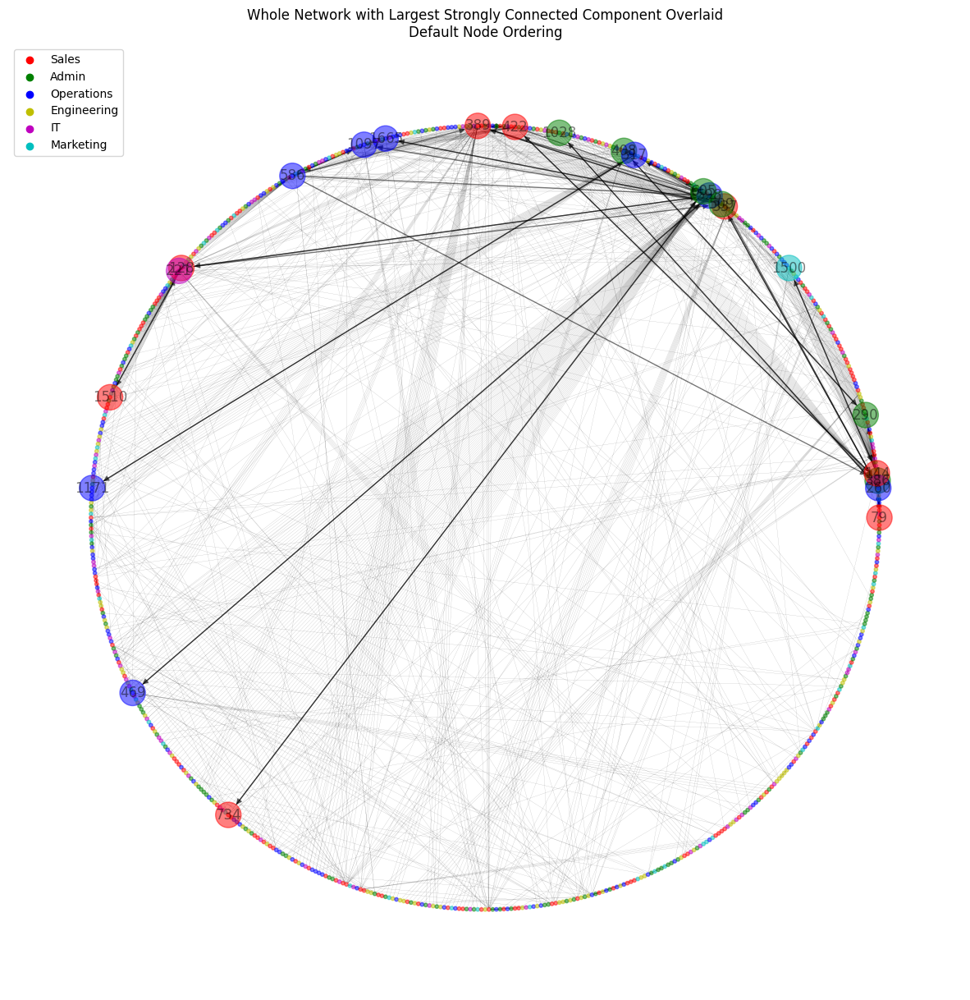

In [ ]:
overlay_plot_maker(largest_SCC,pos_circular,'Whole Network with Largest Strongly Connected Component Overlaid\nDefault Node Ordering')

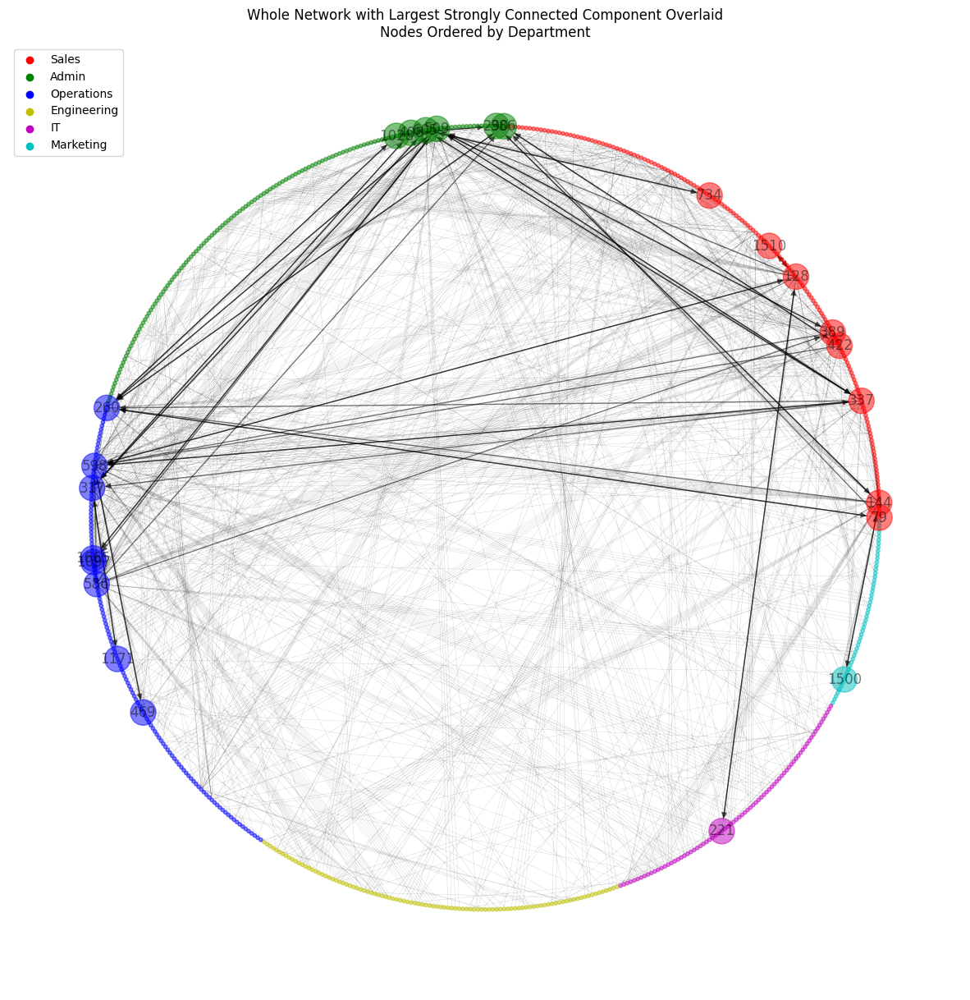

In [ ]:
overlay_plot_maker(largest_SCC,pos_circular_ordered,'Whole Network with Largest Strongly Connected Component Overlaid\nNodes Ordered by Department')

### 4.7 Make subgraph of less communicating nodes

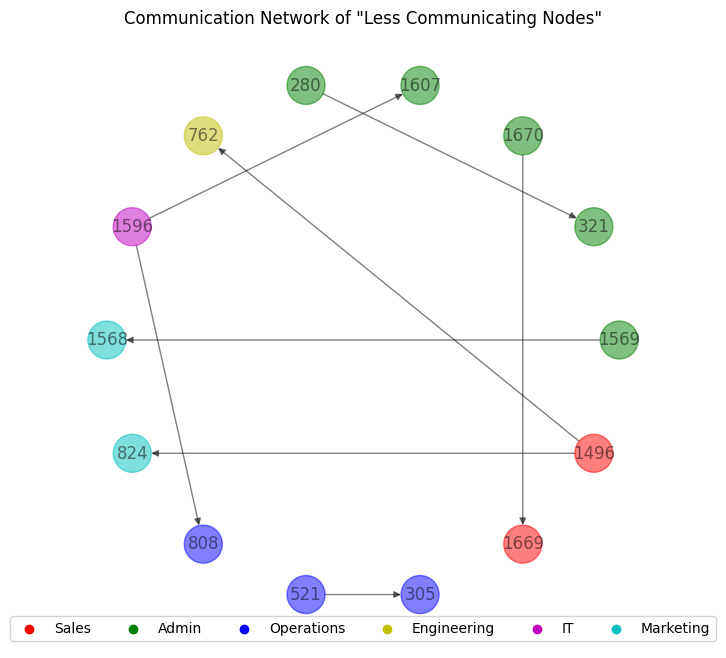

In [ ]:
Sub_Nt = Ntwrk.subgraph(low_comm_nodes)
dept_ordered_nodes = sorted(Sub_Nt.nodes, key=lambda u: Sub_Nt.nodes[u]['dept'])
theta = (np.linspace(0,1,len(Sub_Nt)+1)[:-1]*2*np.pi).astype(np.float32)
pos_custom = dict(zip(dept_ordered_nodes,np.column_stack([np.cos(theta),np.sin(theta)])))
custom_colors = [v['color'] for _,v in Sub_Nt.nodes(data=True)]
plt.figure(figsize=(8,8))
nx.draw_networkx(Sub_Nt,pos=pos_custom,node_size=750,node_color=custom_colors,alpha=.5)
add_custom_legend(); plt.legend(loc='lower center',ncol=N_dept); plt.axis('off')
plt.title('Communication Network of "Less Communicating Nodes"'); plt.show()

When contrast this subgraph plot of "less communicating nodes" with that of previous section (i.e. subgraph plot of the "largest strongly connected component", which is a subset of "both-way communicating employees" 😊) we observe a huge difference (as expected 😊) in terms of activity, visually expressed by the presence/absence of edges.

### 4.8 Intra-departmental communication
We can also visualize intra-department (i.e. within-department) communication for each department 😊, again using sub-network feature of **nx**, as follows:

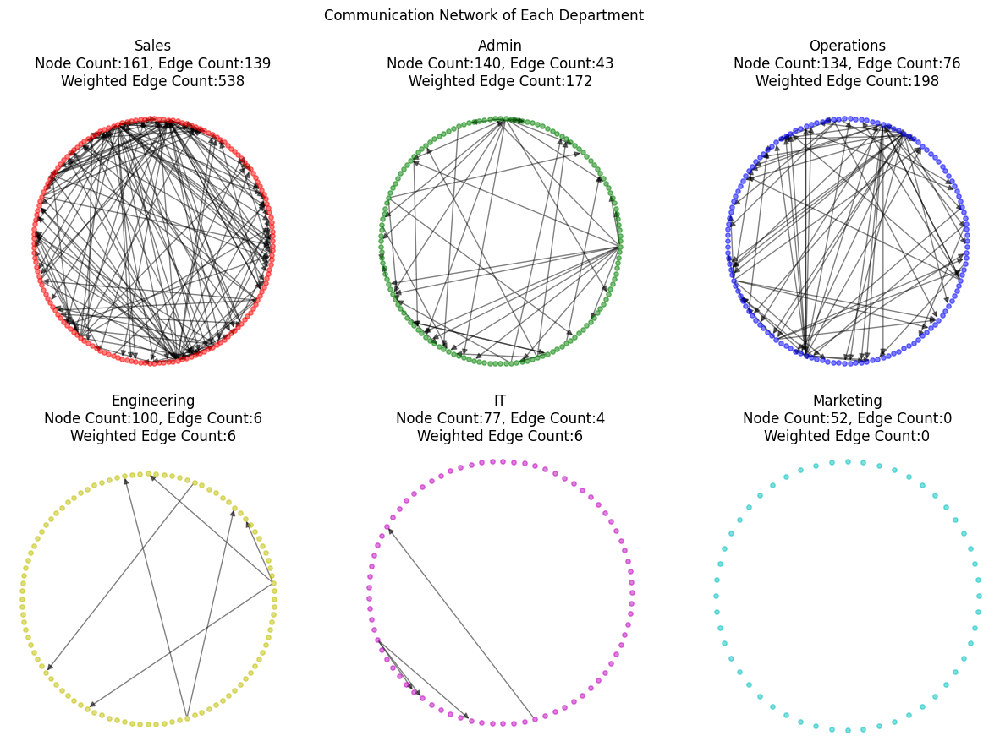

In [ ]:
_, ax = plt.subplots(2,3,figsize=(15,10)); ax_list = ax.flatten()
for idx in range(N_dept):
  ax_now = ax_list[idx]
  Sub_Nt = Ntwrk.subgraph(nodes_by_dept[idx])
  Sub_Nt_edge_cnt = sum([data['weight'] for u,v,data in Sub_Nt.edges(data=True)])
  pos_custom = nx.circular_layout(Sub_Nt)
  nx.draw_networkx(Sub_Nt,node_size=15,with_labels=False,pos=pos_custom,node_color=custom_cmap[idx],alpha=.5,ax=ax_now)
  ax_now.set_axis_off(); ax_now.set_title(f'{dept_names[idx]}\nNode Count:{len(Sub_Nt)}, Edge Count:{len(Sub_Nt.edges)}\nWeighted Edge Count:{Sub_Nt_edge_cnt}')
plt.suptitle('Communication Network of Each Department'); plt.show()

Note that in the above visual, panels are sorted (from left to right and upper to lower) by node count (i.e. number of employees) in departments, not by the edge count (i.e. number of messages within department). Note also that, along with departmental node and edge counts, we have also reported "weighted edge counts," which agree with the total departmental message counts given in Section 2.2. To verify this assertion, please compare/contrast these "weighed edge counts" with the intra-departmental message counts reported on the diagonal of the 2nd heatmap of Section 2.2. 😊

### 4.9 Inter-departmental communication
Let us view inter-departmental (i.e. across-departments) communication with a larger plot this time:

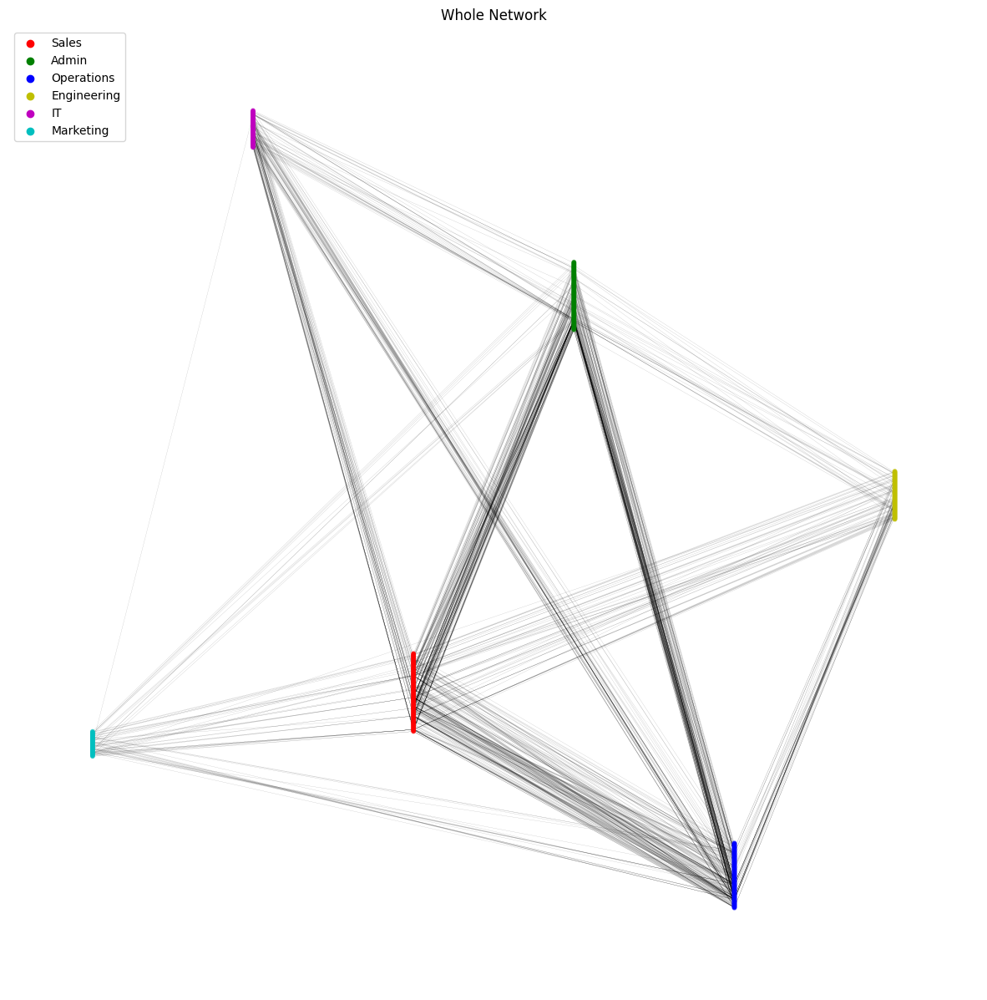

In [ ]:
plt.figure(figsize=(15,15))
nx.draw_networkx(Ntwrk,pos=custom_pos_linear,**options)
add_custom_legend(); plt.legend(loc='upper left'); plt.axis('off'); plt.title('Whole Network'); plt.show()

### 4.10 Quantify/measure node importance using different metrics
Let us first thoroughly analyze our network using the following (different) measures of "node importance":
- In simple terms, **degree** of a node is the number connections it makes. For directed networks, we may distinguish between the number of *incoming* and *outgoing* connections as **in-degree** and **out-degree**. However, in practice, "direction" is ignored frequently and most comparisons are based on the **total-degree**, which is the sum of in- and out-degrees.

We can use "degree" as a "node importance" metric, as it is, however while comparing degrees, network size (i.e. number of nodes) matters. For instance, consider a node with degree 5 in a network with 10 nodes and in another network with 100 nodes. "Degree 5" may be considered relatively important for the 1st network, because, the underlying node is connected with 5/10 = 50% of the nodes, whereas in the 2nd network it is connected only to 5/10 = 5% of the nodes. Therefore, **normalizing** *degree* with the *network size* is a good idea to have a more sensible and fair measure of node importance. 😊 This motivation takes us to the next measure, namely "degree-centrality."
- **Degree-centrality** of a node is the fraction of nodes it is connected to. In an undirected graph, it is the ratio of total degree (i.e. sum of in- and out-degrees) to $n-1$, where $n$ is the "number of nodes" in the network.

Degree-centrality measures importance of nodes locally, i.e. it does not really tell us where the node is in the network physically or **geographically**. For instance, a "low degree-centrality" node may physically be located in the center of the network yet it can connect several large communities (i.e. highly inter-connected sub-networks). We can infer that such a node plays a critical role in the network. On the contrary, a node with "high degree-centrality" can be located in the periphery (i.e. far out from the core) of the network. We can imagine that the importance of such a node will only be local. That is why we need to use several metrics to quantify node importance, as different metrics can give a deeper insight into different characteristics of nodes. Hence, let us introduce several other metrics that are based on the concept of **closeness** or **shortest paths**:
- **Closeness-centrality** is the average distance of a node to the rest of the nodes in the network (in terms of the number of steps needed to reach them). This allows us to have a notion of the average proximity to the rest of the network. Using this metric, we can identify an **influencer** or "key actor" as the person (or people) whose closeness-centrality value is above a certain threshold.
- **Betweenness-centrality** this metric (between 0 and 1) is a metric to quantify the influence a node on the information flow of the network. Using this metric, we can identify the nodes that serve as a bridge between groups or clusters of nodes. It is computed by calculating the shortest path between all the pairs of nodes, which allows to measure the frequency at which a node is located between the shortest paths of other nodes.
- **Eigenvector and PageRank centrality:** Eigenvector centrality is a more sophisticated view of centrality, as it measures a node's importance by considering the importance of its neighbors as well. Therefore, in this view of centrality, a node with few connections could have a very high value if those few connections are to very "well-connected others." Eigenvector centrality allows for connections to have a variable value, so that connecting to some vertices has more benefit than connecting to others.
- **Hubs** and **authorities** scores (between 0 and 1) are a natural generalization of eigenvector centrality and computed using Hyperlink-Induced Topic Search (HITS) algorithm, originally developed for rating web pages via link analysis. In our case, instead of web pages that constitute nodes in the Internet, we have employees as nodes in our relatively small in-company communication network. 😊 By setting some proper thresholds on **hubs** and **authorities** scores produced by the HITS algorithm, we can classify nodes as regular, hub, or authority. A node with high "hub score" points to many nodes with high "authority score" nodes, and similarly a high authority node receives from many good hubs.

In [ ]:
degree_cent = np.array(list(nx.degree_centrality(Ntwrk).values())).reshape(-1,1) # Degree centrality
closeness_cent = np.array(list(nx.closeness_centrality(Ntwrk).values())).reshape(-1,1) # Closeness centrality
betweenness_cent = np.array(list(nx.betweenness_centrality(Ntwrk).values())).reshape(-1,1) # Betweenness centrality
eigen_cent = np.array(list(nx.eigenvector_centrality(Ntwrk).values())).reshape(-1,1) # Eigenvector centrality
# Hubs and Authorities are estimated based on outgoing and incoming links respectively, via HITS algorithm
hubs, authorities = nx.hits(Ntwrk,normalized=True); hub_score = np.array(list(hubs.values())).reshape(-1,1); authority_score = np.array(list(authorities.values())).reshape(-1,1)
# Merge/concatenate the results horizontally
df_results = pd.DataFrame(np.hstack((np.array([(u,v['dept']) for u,v in Ntwrk.nodes(data=True)]),degree_cent,closeness_cent,betweenness_cent,eigen_cent,hub_score,authority_score)),columns=['Employee_Id','Employee_Dept','Degree_Cent','Closeness_Cent','Betweenness_Cent','Eigen_Cent','Hub_Score','Authority_Score'])
df_results = df_results.astype(dtype={'Employee_Id':'int','Degree_Cent':'float','Closeness_Cent':'float','Betweenness_Cent':'float','Eigen_Cent':'float','Hub_Score':'float','Authority_Score':'float'})
print('Results table reporting various "importance metrics" for all nodes (only first 5 rows are shown):')
display(df_results.head())
print('\nSummary statistics for "results table:"')
df_results.iloc[:,2:].agg(['min','median','mean','max','count','sum']).applymap("{0:.2f}".format)

Results table reporting various "importance metrics" for all nodes (only first 5 rows are shown):


,Employee_Id,Employee_Dept,Degree_Cent,Closeness_Cent,Betweenness_Cent,Eigen_Cent,Hub_Score,Authority_Score
0,79,Sales,0.018100,0.013213,0.000498,0.048474,0.00006,7.080270e-05
1,48,IT,0.003017,0.011908,0.000000,0.017615,-0.00000,6.640641e-04
2,63,Sales,0.006033,0.017854,0.000000,0.065378,-0.00000,1.025180e-04
3,58,Sales,0.001508,0.010774,0.000000,0.016196,-0.00000,3.668170e-07
4,70,Operations,0.001508,0.010774,0.000000,0.016196,-0.00000,1.834085e-07



Summary statistics for "results table:"


,Degree_Cent,Closeness_Cent,Betweenness_Cent,Eigen_Cent,Hub_Score,Authority_Score
min,0.00,0.00,0.00,0.00,-0.00,-0.00
median,0.00,0.01,0.00,0.02,0.00,0.00
mean,0.01,0.01,0.00,0.03,0.00,0.00
max,0.13,0.03,0.01,0.19,0.58,0.09
count,664.00,664.00,664.00,664.00,664.00,664.00
sum,3.44,6.18,0.10,16.64,1.00,1.00


Using this magic **results** table, which has the scores (based on different metrics of importance) for all the nodes in our network, we can quantify, sort, and characterize the nodes whichever way we like. 😊
### 4.11 Redo graph visualizations by highlighting node importance
In the previous section, we gathered (actually computed 😊) many critical data or features about “node importance” using many different perspectives or metrics. As the next (natural) step in our network analysis journey, we can try redoing the network plots to display or convey this added (node importance) information as well. As a fruit of this effort, we hope to have even more informative visuals. Let’s give it a try:

In [ ]:
# We'll first define a few helper functions to make our magic network visuals 😊
def normalize_scores(scores):
  min_score = np.min(scores)
  return (scores-min_score)/(np.max(scores)-min_score)

In [ ]:
def plot_maker_by_feature(feature_name,top_n):
  top_nodes_by_feature = df_results.nlargest(top_n,feature_name)[['Employee_Id','Employee_Dept',feature_name]].set_index('Employee_Id')
  display(top_nodes_by_feature)
  node_list = top_nodes_by_feature.index; Sub_Nt = Ntwrk.subgraph(node_list)
  larger_node_sizes = dict(zip(node_list,np.round(300+1000*normalize_scores(top_nodes_by_feature[feature_name]))))
  ordered_sizes = [larger_node_sizes[u] for u in Sub_Nt]
  dept_colors = [v['color'] for u,v in Sub_Nt.nodes(data=True)]
  options_local = {'node_size':ordered_sizes,'node_color':dept_colors,'alpha':.5,'width':3,'arrowsize':25}
  _,(ax1,ax2) = plt.subplots(1,2,figsize=(15,7))
  nx.draw_networkx(Ntwrk,ax=ax1,pos=custom_pos_ellipsoid,**options)
  nx.draw_networkx(Sub_Nt,ax=ax1,pos=custom_pos_ellipsoid,**options_local)
  ax1.set_title(f'Nodes with Top {top_n} {feature_name} Scores Highlighted with Size\nEllipsoid Layout'); ax1.set_axis_off()
  nx.draw_networkx(Ntwrk,ax=ax2,pos=pos_circular_ordered,**options)
  nx.draw_networkx(Sub_Nt,ax=ax2,pos=pos_circular_ordered,**options_local)
  ax2.set_title(f'Nodes with Top {top_n} {feature_name} Scores Highlighted with Size\nCircular Layout'); ax2.set_axis_off()
  add_custom_legend(); ax2.legend(loc='right',bbox_to_anchor=(0,.9)); plt.show()

,Employee_Dept,Degree_Cent
Employee_Id,,
598,Operations,0.126697
144,Sales,0.117647
128,Sales,0.113122
605,Admin,0.107089
586,Operations,0.098039


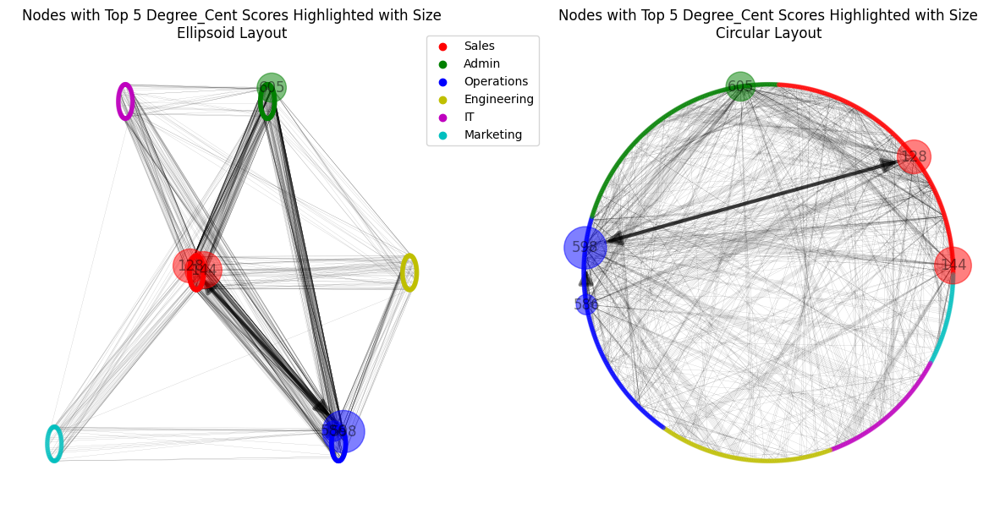

In [ ]:
plot_maker_by_feature('Degree_Cent',5)

,Employee_Dept,Closeness_Cent
Employee_Id,,
32,Sales,0.025720
194,Admin,0.025270
103,Sales,0.024558
704,Operations,0.022354
840,Admin,0.021526


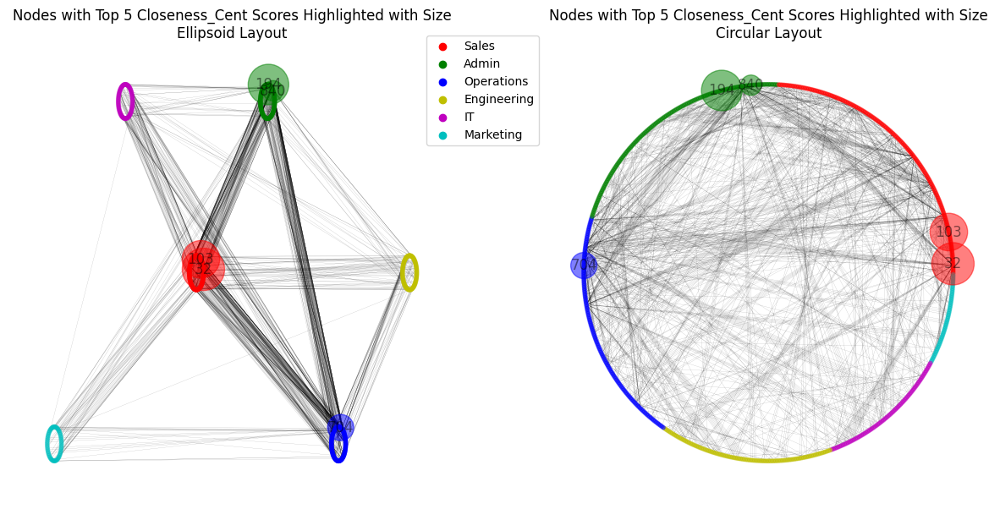

In [ ]:
plot_maker_by_feature('Closeness_Cent',5)

,Employee_Dept,Betweenness_Cent
Employee_Id,,
509,Admin,0.012186
337,Sales,0.011897
598,Operations,0.011451
128,Sales,0.007266
260,Operations,0.006823


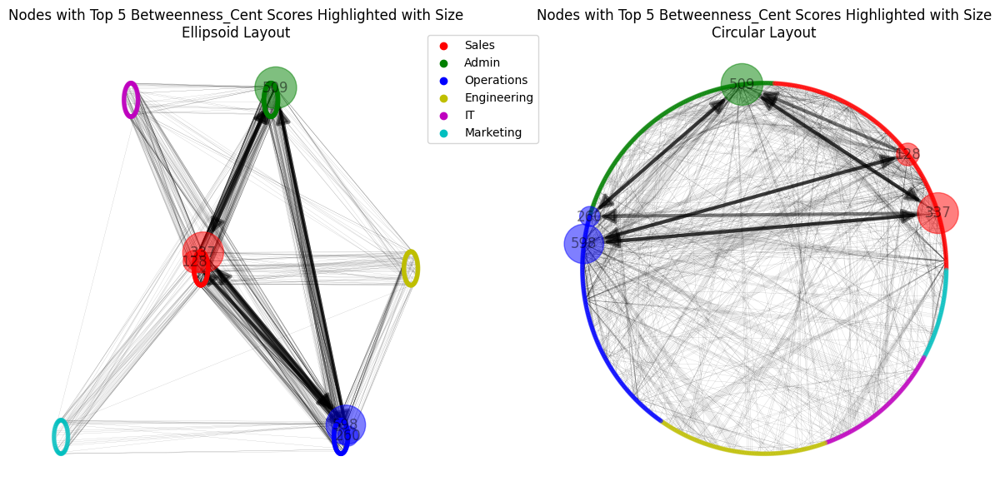

In [ ]:
plot_maker_by_feature('Betweenness_Cent',5)

,Employee_Dept,Eigen_Cent
Employee_Id,,
194,Admin,0.186312
260,Operations,0.145078
1283,Admin,0.141281
509,Admin,0.138639
103,Sales,0.138260


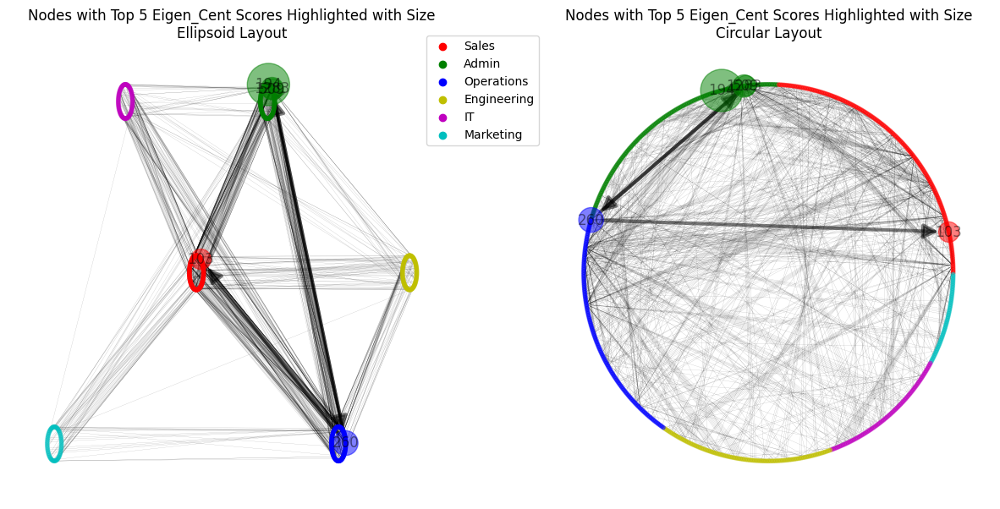

In [ ]:
plot_maker_by_feature('Eigen_Cent',5)

,Employee_Dept,Hub_Score
Employee_Id,,
605,Admin,0.583017
317,Operations,0.067027
389,Sales,0.059830
598,Operations,0.033678
483,Sales,0.033581


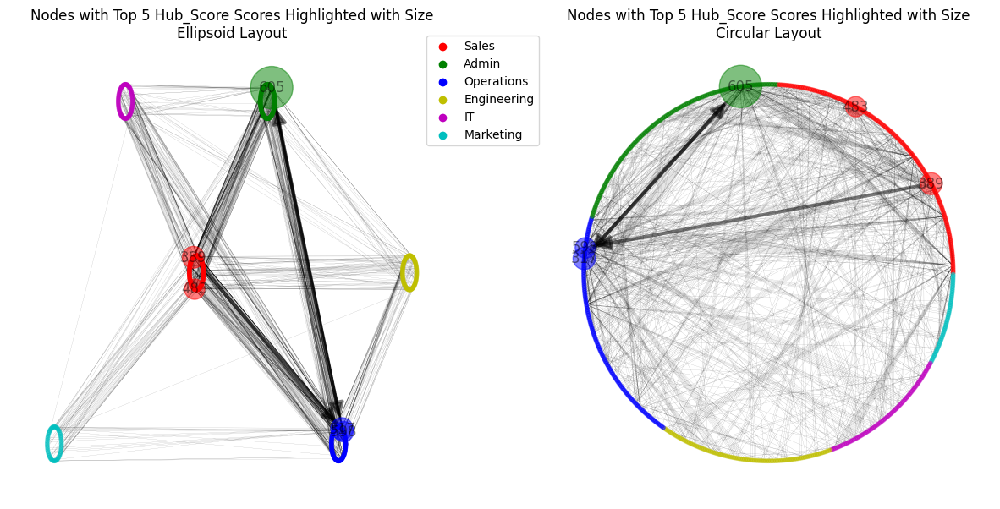

In [ ]:
plot_maker_by_feature('Hub_Score',5)

,Employee_Dept,Authority_Score
Employee_Id,,
704,Operations,0.089054
734,Sales,0.051558
254,Sales,0.044164
272,Operations,0.043625
317,Operations,0.040980


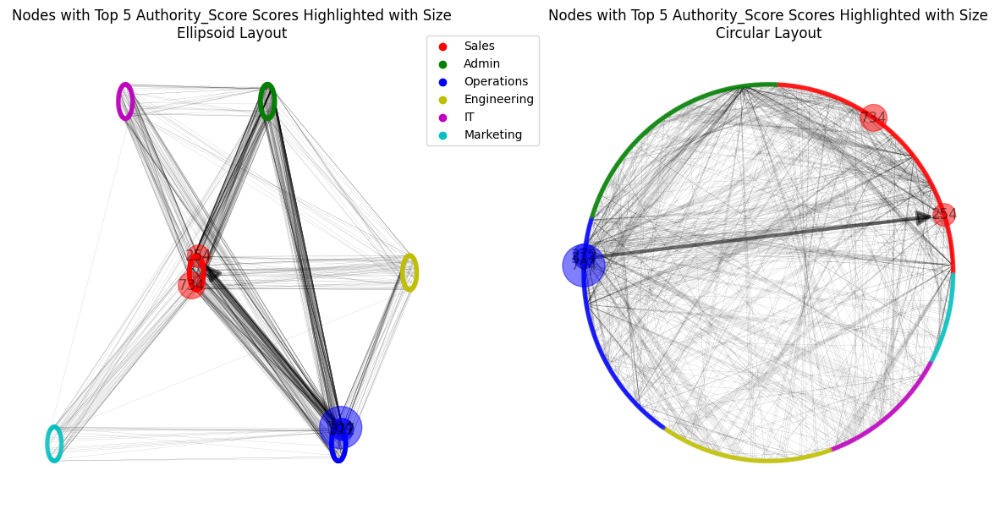

In [ ]:
plot_maker_by_feature('Authority_Score',5)

In [ ]:
top10_nodes_degree_cent = df_results.nlargest(10,'Degree_Cent')[['Employee_Id','Employee_Dept','Degree_Cent']].set_index('Employee_Id')
top10_nodes_degree_cent
# top10_nodes_degree_cent.mode()

,Employee_Dept,Degree_Cent
Employee_Id,,
598,Operations,0.126697
144,Sales,0.117647
128,Sales,0.113122
605,Admin,0.107089
586,Operations,0.098039
389,Sales,0.093514
509,Admin,0.082956
317,Operations,0.082956
337,Sales,0.063348


## 5. Figure out important nodes/employees in the network
Now that we have all kinds of scores regarding node importance, we can merge or melt this info in a pot to figure out important nodes (employees) from many perspectives. To that end, let's collect id. #s all top 5 scorers with respect to 6 different node importance measures, namely **Degree_Cent,	Closeness_Cent,	Betweenness_Cent,	Eigen_Cent,	Hub_Score,	Authority_Score** that we computed earlier:

In [ ]:
df_top5_by_feature = pd.DataFrame()
for feature_name in ['Degree_Cent','Closeness_Cent','Betweenness_Cent','Eigen_Cent','Hub_Score','Authority_Score']:
  df_top5_by_feature[feature_name] = df_results.nlargest(5,feature_name).Employee_Id.values
display(df_top5_by_feature)

,Degree_Cent,Closeness_Cent,Betweenness_Cent,Eigen_Cent,Hub_Score,Authority_Score
0,598,32,509,194,605,704
1,144,194,337,260,317,734
2,128,103,598,1283,389,254
3,605,704,128,509,598,272
4,586,840,260,103,483,317


Let's merge id. #s in the columns of this table into a set, so that we can remove repeated entries (i.e. id. #s):

In [ ]:
important_nodes = set(df_top5_by_feature.values.flatten())
print(f'List of {len(important_nodes)} nodes (employees) with top {df_top5_by_feature.shape[0]} scores (in {df_top5_by_feature.shape[1]} different importance categories):\n{*sorted(important_nodes),}')

List of 20 nodes (employees) with top 5 scores (in 6 different importance categories):
(32, 103, 128, 144, 194, 254, 260, 272, 317, 337, 389, 483, 509, 586, 598, 605, 704, 734, 840, 1283)


If there were no repetitions, we would have 6x5 = 30 entries or id. #s, however, it turned out that we have only 20 unique entries in the table. Which means that "quite few the important people" are important from several different perspectives. 😊 We also expect to have a large overlap between these 20 important  nodes (i.e. people or employees) and the nodes in the "largest strongly connected". Let's check the validity of this anticipation:

In [ ]:
overlap_nodes = largest_SCC&important_nodes
print(f'We are right again 😊, there {len(overlap_nodes)} overlapping or common nodes between important_nodes and largest_SCC, which are:\n{*sorted(overlap_nodes),}')

We are right again 😊, there 11 overlapping or common nodes between important_nodes and largest_SCC, which are:
(128, 144, 260, 317, 337, 389, 509, 586, 598, 605, 734)


Our "importance node identification" technique is a composite or compound method, which is based on merging results generated by several other well-established measures through a voting like scheme and then intersecting the outcome with nodes of the "largest connected component" obtained via "connectivity analysis." Therefore, as we selected these relatively more important 11 nodes by combining the analytic power of several "node importance metrics" with the perspective of "connectivity analysis", we expect that our results/selection will be sensible and correlate well with the naturally occurring communication patterns in the network.

Finally let's also collect other info (like 'department,' 'location,' and 'age,' which is available in the df_employees table) for these important people:

In [ ]:
df_overlap_nodes = df_employees2.loc[overlap_nodes,:]
display(df_overlap_nodes)
print(f'\nDistribution/grouping of top {len(df_overlap_nodes)} important people by department:')
df_overlap_nodes.department.value_counts().reset_index().rename(columns={'index':'Department_Name','department':'count'},index=dict(zip(range(3),['']*3)))

,department,location,age
id,,,
128,Sales,France,47
509,Admin,US,39
260,Operations,US,48
389,Sales,France,39
605,Admin,France,31
586,Operations,France,38
144,Sales,US,50
337,Sales,US,37
598,Operations,US,38



Distribution/grouping of top 11 important people by department:


,Department_Name,count
,Sales,5
,Operations,4
,Admin,2


We note that these important people are mostly from Sales (count=5), Operations (count=4), and Admin (count=2), which agrees with all of the observations that we have been making so far.

Let's also overlay the subnet of these important people on the whole graph using two different layouts, namely circular and our custom ellipsoid layout that nicely and smartly 😊 places nodes at different locations by departments:

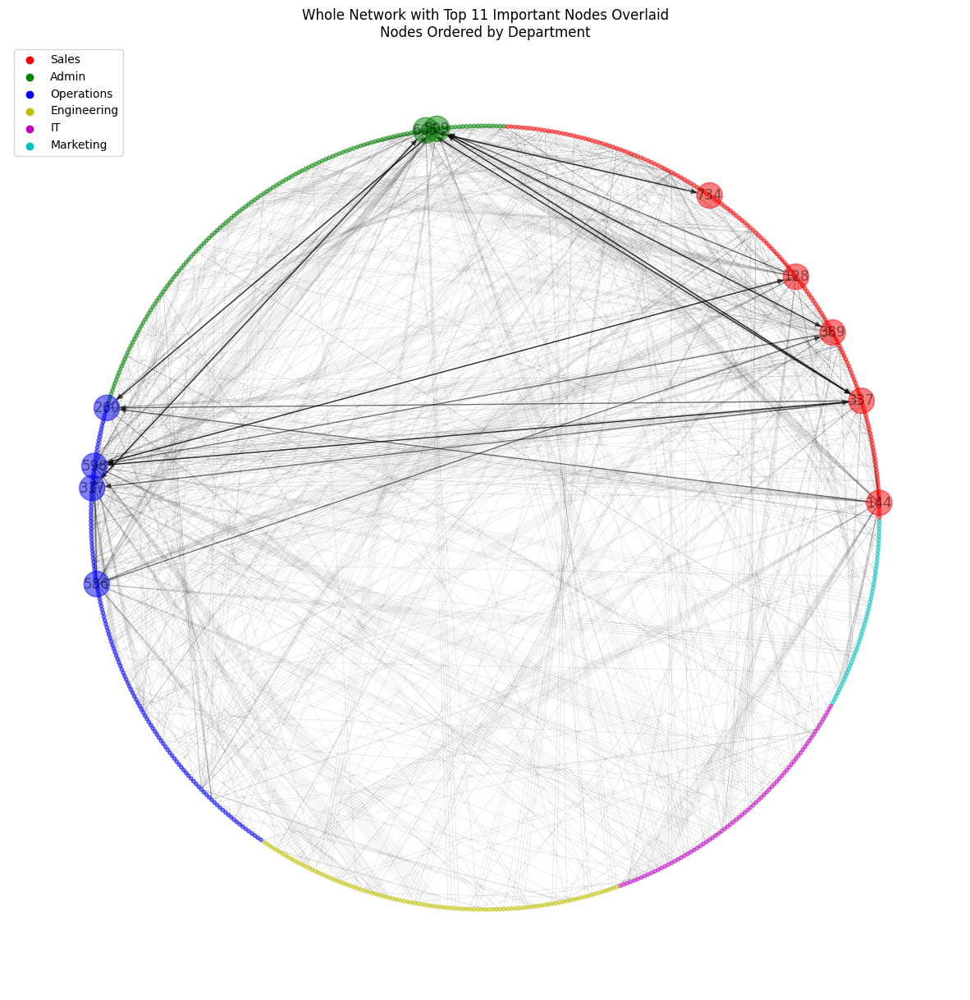

In [ ]:
overlay_plot_maker(overlap_nodes,pos_circular_ordered,'Whole Network with Top 11 Important Nodes Overlaid\nNodes Ordered by Department')

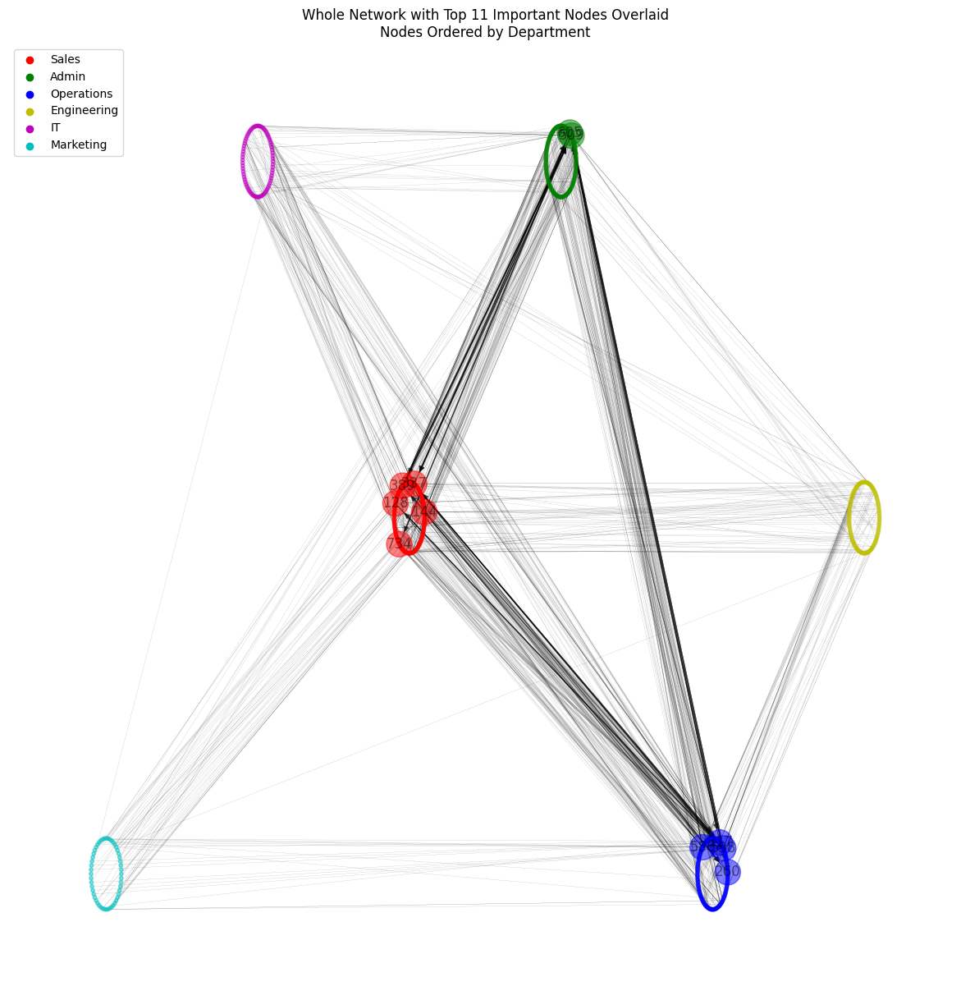

In [ ]:
overlay_plot_maker(overlap_nodes,custom_pos_ellipsoid,'Whole Network with Top 11 Important Nodes Overlaid\nNodes Ordered by Department')

We happily observe that communication activity of important nodes nicely and visually 😊 agree/correlate with the naturally occurring communication patterns in our big **Ntwrk**, as we've anticipated.